<span style="font-size:2em; font-weight:bold;"> Grenada Rainfall Analysis: Intensity Duration Frequency (IDF) Curve Development - Block Maxima (BM) and Peaks-over-threshold (POTS)</span>
***

This code was written to analyze the rainfall data across data from all available rainfall stations with the following objectives:

1) Spatial Overview of Stations
2) Data Completeness of Stations
3) Correlation between stations and covariates e.g., elevation
4) Variogram/Correlation model estimation for daily rainfall
5) Kriging estimation of missing daily rainfall data

# 1.0 Import Data and Modules

## 1.1 Import Modules

In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
import seaborn as sns
from scipy.interpolate import RBFInterpolator, NearestNDInterpolator
from pyproj import Transformer
from IPython.display import clear_output

# WGS84 Lat/Lon to Grenada UTM Zone 20N
transformer = Transformer.from_crs("EPSG:4326", "EPSG:32620", always_xy=True)

# mapping
import pygmt
import xarray as xr

# VarioCorreKrigE
from VarioCorreKrigE.variofit import variofitmulti

# utilities
from corr_imput_utilities import calculate_yearly_completeness, LongLatToPolar, cossim, make_fake_missing, evaluate_imputation, run_OK_all_days, daily_train_test_gpr, gpr_impute_by_day

## 1.2 Import and clean Data

### 1.2.1 Import Data

In [2]:
# station names and locations
stations = pd.read_excel(r'Data\GRN_RAINFALL_DATA_NAWASA_2025.xlsx',sheet_name='Raingauge Coordinates')

# NAWASA Rainfall data
nawasa_rainfall = pd.read_excel(r'Data\GRN_RAINFALL_DATA_NAWASA_2025.xlsx',sheet_name='Rainfall data')

# point salines/MBIA
mbia_rainfall = pd.read_csv(Path(r'Data\GRN_RAINFALLDATA_MBIA.csv'))

### 1.2.2 Data cleaning

In [3]:
# NAWASA DATA
rain_col = nawasa_rainfall.columns[1:]
nawasa_rainfall[rain_col] = nawasa_rainfall[rain_col].replace({
    'trace': 0.0,
    'Trace': 0.0,
    't': 0.0,
    'T': 0.0,
    'No data collected': 0,
    'No data collected ': 0,
    '?': np.nan,
    '`': np.nan,
    ' ': np.nan,
    '-': np.nan,
    '-   ': np.nan
})
nawasa_rainfall.iloc[:, 1:] = nawasa_rainfall.iloc[:, 1:].mask(nawasa_rainfall.iloc[:, 1:] < 0, np.nan)
nawasa_rainfall.iloc[:, 1:] = nawasa_rainfall.iloc[:, 1:].apply(pd.to_numeric, errors='coerce')
nawasa_rainfall['date'] = pd.to_datetime(nawasa_rainfall['date'], format='mixed', errors='coerce')

# Point Salines
rain_col = mbia_rainfall.columns[3]
mbia_rainfall[rain_col] = mbia_rainfall[rain_col].replace({
    'T': 0.0,
    ' T': 0.0,
    '  T': 0.0,
    '0.T': 0.0,
    'm': np.nan,
    'M': np.nan,
    '0.0.': 0.0
})
mbia_rainfall['date'] = pd.to_datetime(mbia_rainfall[['Year','Month','Day']])
mbia_rainfall.iloc[:, 3] = pd.to_numeric(mbia_rainfall.iloc[:, 3], errors='coerce')
mbia_rainfall_clean = mbia_rainfall[['date', mbia_rainfall.columns[3]]].copy()
mbia_rainfall_clean.columns = ['date', 'Point Saline (MBIA)']

# merge and clean forced
rainfall_merged = pd.merge(nawasa_rainfall, mbia_rainfall_clean, on='date', how='outer')
rainfall_merged = rainfall_merged.sort_values('date').reset_index(drop=True)
rainfall_merged['date'] = pd.to_datetime(rainfall_merged['date'], errors='coerce')
for col in rainfall_merged.columns[1:]:
    rainfall_merged[col] = pd.to_numeric(rainfall_merged[col], errors='coerce')
rainfall_merged = rainfall_merged.sort_values("date").reset_index(drop=True)
print(rainfall_merged.info())

# drop petit martinique and Carriacou (off-island)
rainfall_merged = rainfall_merged.drop(columns=['Petit Martinique', 'Carriacou (WTP)'])
stations = stations[~stations["Stations"].isin(['Petit Martinique', 'Carriacou (WTP)'])].reset_index(drop = True)
ncolumns = rainfall_merged.shape[1]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14885 entries, 0 to 14884
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date                 14885 non-null  datetime64[ns]
 1   Tufton Hall (WTP)    3261 non-null   float64       
 2   Mt.Plaisir (WTP)     3518 non-null   float64       
 3   Concord (WTP)        3847 non-null   float64       
 4   Blaize (TANK)        1420 non-null   float64       
 5   Mamma Cannes (WTP)   3577 non-null   float64       
 6   Les Avocat (WTP)     5516 non-null   float64       
 7   Pomme Rose (WTP)     3371 non-null   float64       
 8   Mardigras (WTP)      3418 non-null   float64       
 9   Vendome (WTP)        3828 non-null   float64       
 10  Annandale (WTP)      4573 non-null   float64       
 11  Peggy's Whim (WTP)   3583 non-null   float64       
 12  Petit Etang (WTP)    3629 non-null   float64       
 13  Grand Etang (LAKE)   1794 non-n

C:\Users\LEGION\AppData\Local\Temp\ipykernel_33460\1504139512.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  nawasa_rainfall[rain_col] = nawasa_rainfall[rain_col].replace({


## 1.3 Plot of All stations

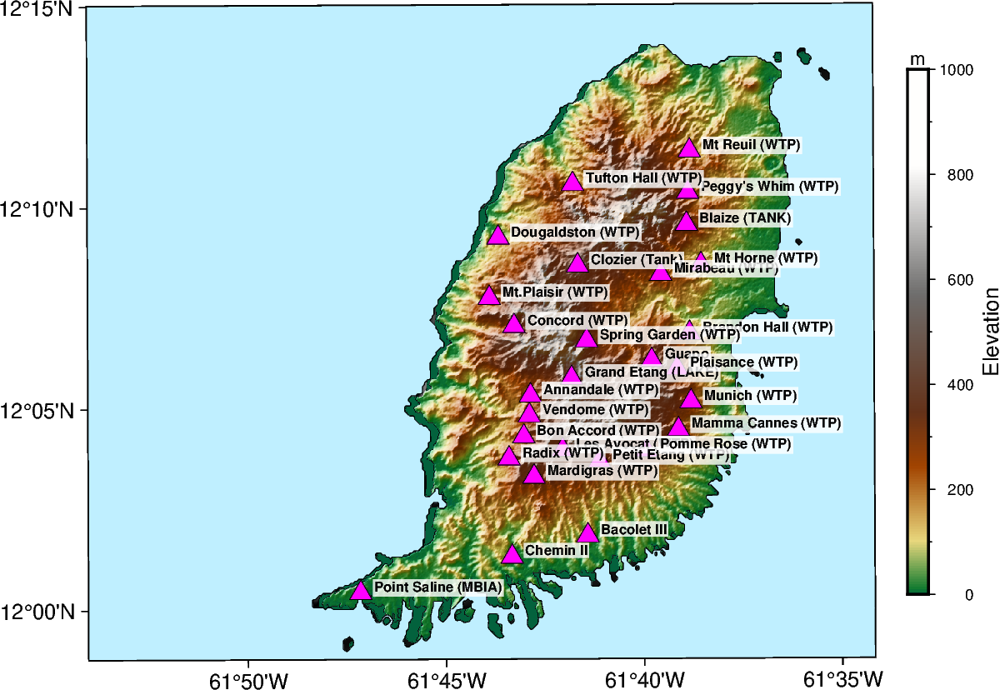

In [4]:
# Spatial Plot
region = [-61.90,-61.57,11.98,12.25]
grid = pygmt.datasets.load_earth_relief(resolution="01s",region=region)

# make figure
fig = pygmt.Figure()
pygmt.makecpt(cmap="geo", series=[0, 1000, 5])
fig.grdimage(grid=grid, projection="U20N/12c", frame="a", cmap=True, shading=True, region=region)
fig.coast(resolution="full", shorelines=True, water = 'lightblue1', region=region)

# plot stations
fig.plot(x=stations.Lon, y=stations.Lat, style="t0.4c", pen="0.01p,black", fill="magenta1")

# plot text
fig.text(
    x=stations["Lon"],
    y=stations["Lat"],
    text=stations["Stations"].astype(str),
    font="6p,Helvetica-Bold,black",
    justify="LM",
    offset="0.2c/0.1c",
    fill = 'white@20',
)

fig.colorbar(position="JMR+o0.5c/0c+w8c", frame=["x+lElevation", "y+lm"])
# fig.savefig("grenada_caribbean_map.tiff", dpi=500)
fig.show(method = 'notebook',dpi=200,width=720)

## 1.4 Plot of All Rainfall Data

### 1.4.1 Stem Plot

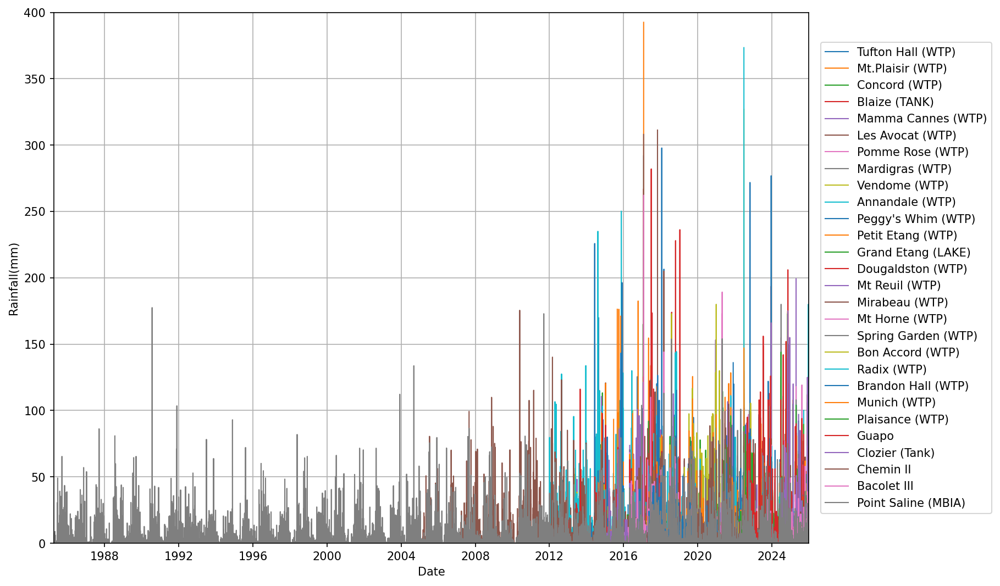

In [5]:
#plotting all rainfall
fig, ax = plt.subplots(figsize=(12,7),dpi = 150, constrained_layout = True)
for i in range(1,ncolumns):
    ax.plot(rainfall_merged.date, rainfall_merged.iloc[:,i], linestyle='-', lw = 1)
ax.legend(rainfall_merged.columns[1:],loc = 'right', bbox_to_anchor=(1.25, 0.5))
ax.set_ylabel('Rainfall(mm)')
ax.set_xlabel('Date')
ax.grid()
ax.set_xlim(rainfall_merged.date.min(), rainfall_merged.date.max())
ax.set_ylim(0,400)
plt.show()

### 1.4.2 Heat Plot: Year bins

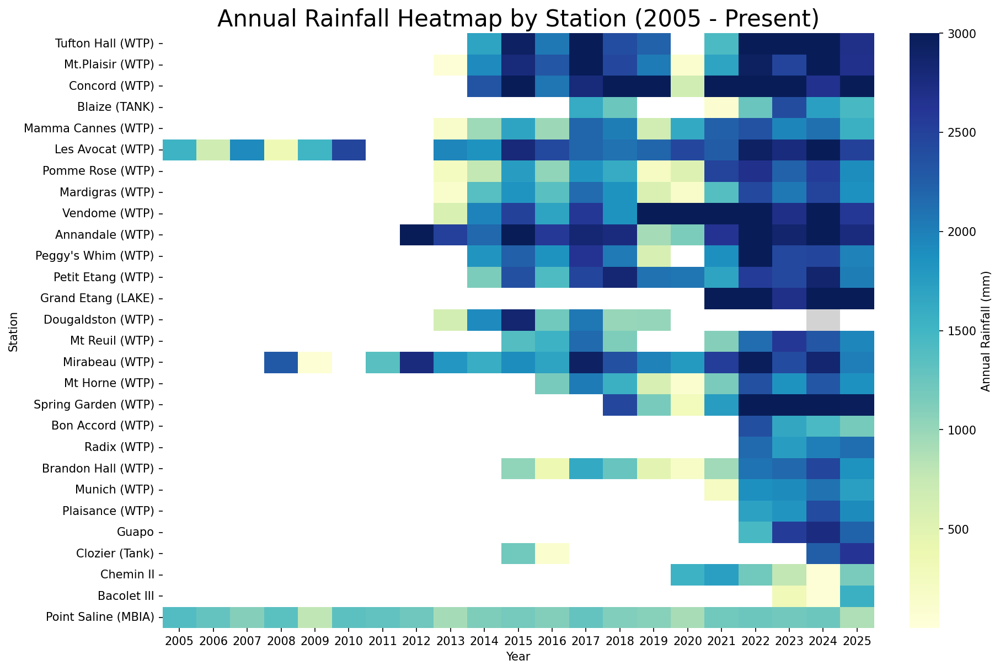

In [6]:
# Filter from 2005 onward
rainfall_filtered = rainfall_merged[rainfall_merged['date'].dt.year >= 2005].copy()
rainfall_filtered['year'] = rainfall_filtered['date'].dt.year

# Group annual totals per station
rain_yearly = rainfall_filtered.drop(columns='date').groupby('year').sum(min_count=1).T

# Mask for missing values
rain_mask = rain_yearly.isna()

# Define custom colormap
cmap = sns.color_palette("YlGnBu", as_cmap=True)
cmap.set_under("lightgray")  # 0 mm = light gray
cmap.set_bad("white")        # NaN = white (no data)

plt.figure(figsize=(12, 8), dpi=150, constrained_layout=True)
sns.heatmap(
    rain_yearly,
    cmap=cmap,
    mask=rain_mask,
    vmin=0.001,   # 0.0 shows as lightgray
    vmax=3000,
    cbar_kws={"label": "Annual Rainfall (mm)"}
)
plt.title("Annual Rainfall Heatmap by Station (2005 - Present)", fontsize=20)
plt.xlabel("Year")
plt.ylabel("Station")
plt.show()

### 1.4.3 Heat Plot: Month bins

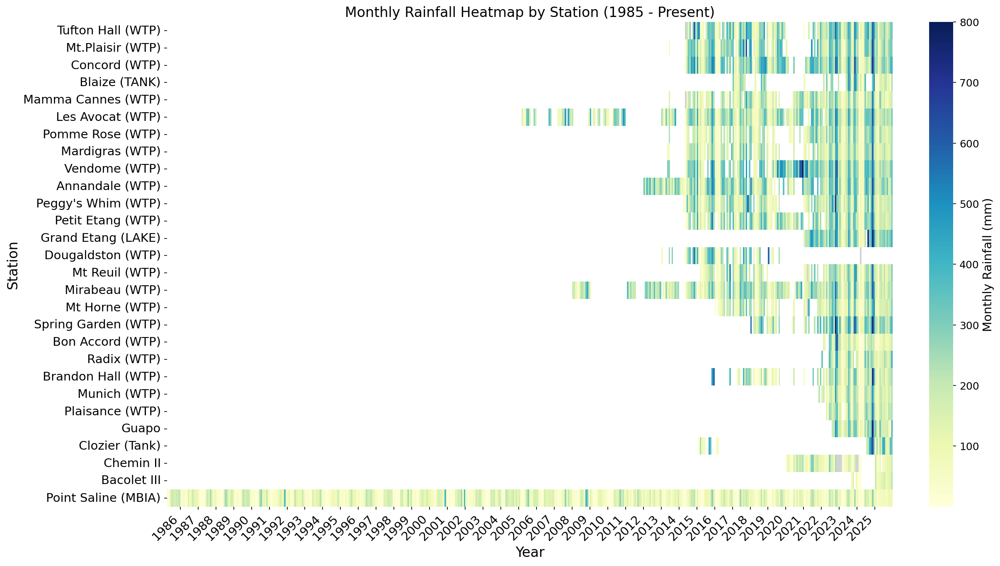

In [7]:
# Prepare Monthly Totals
rainfall_filtered = rainfall_merged[rainfall_merged['date'].dt.year >= 1985].copy()
rainfall_filtered['month'] = rainfall_filtered['date'].dt.to_period('M')

# Group by month, get station rainfall totals per month
rain_monthly = rainfall_filtered.drop(columns='date').groupby('month').sum(min_count=1).T

# Convert PeriodIndex to timestamp for plotting
rain_monthly.columns = rain_monthly.columns.to_timestamp()

# Create Mask and Colormap
rain_mask = rain_monthly.isna()

# Define colormap: white for NaNs, lightgray for 0, YlGnBu for positive rainfall
cmap = sns.color_palette("YlGnBu", as_cmap=True)
cmap.set_under("lightgray")  # True zero
cmap.set_bad("white")        # Missing

# Plot
fig, ax = plt.subplots(figsize=(16, 9), dpi=150, constrained_layout=True)
ax = sns.heatmap(
    rain_monthly,
    cmap=cmap,
    mask=rain_mask,
    vmin=0.01,       # everything 0.001 gets colored
    vmax=np.round(np.max(rain_monthly)/10)*10,
    cbar_kws={"label": "Monthly Rainfall (mm)"},
)

# Generate annual tick positions
years = pd.date_range(start=rain_monthly.columns.min(), end=rain_monthly.columns.max(), freq='YS')
tick_locs = [rain_monthly.columns.get_loc(y) for y in years if y in rain_monthly.columns]

# Apply ticks and labels manually
ax.set_xticks(tick_locs)
ax.set_xticklabels([y.strftime('%Y') for y in years if y in rain_monthly.columns], rotation=45, ha='right', fontsize=12)

# label sizes
ax.tick_params(axis='x', labelsize=14)  # X-tick label font
ax.tick_params(axis='y', labelsize=14)  # Y-tick label font
colorbar = ax.collections[0].colorbar
colorbar.ax.set_ylabel("Monthly Rainfall (mm)", fontsize=14)
colorbar.ax.tick_params(labelsize=12)
plt.title("Monthly Rainfall Heatmap by Station (1985 - Present)", fontsize=16)
plt.xlabel("Year", fontsize=16)
plt.ylabel("Station", fontsize=16)
# fig.savefig('grenada_monthly_rainfall.svg')
plt.show()

## 1.5 Long dataframe creation

In [8]:
# convert to long-format
rainfall_long = rainfall_merged.melt(
    id_vars="date",
    var_name="station_id",
    value_name="rainfall"
)

# create datetime_id for ease of referencing
rainfall_long["date_id"] = rainfall_long["date"].dt.strftime("%Y%m%d")
rainfall_long = rainfall_long[["date", "date_id", "station_id", "rainfall"]]

# merge with stations to get elevation and lat/lon
stations = stations.rename(columns={"Stations": "station_id"})
rainfall_long = rainfall_long.merge(stations, on="station_id", how="inner")

# 2.0 Data Completeness

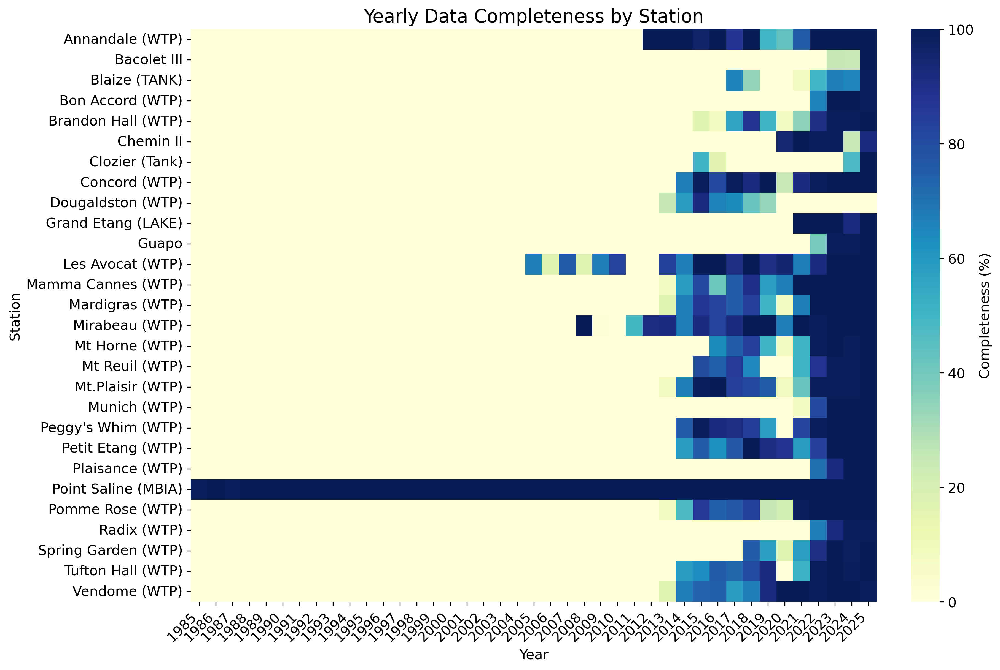

In [9]:
completeness_summary = calculate_yearly_completeness(rainfall_merged)
completeness_pivot = completeness_summary.pivot(index="station", columns="year", values="completeness_%")
plt.figure(figsize=(12, 8), dpi=300, constrained_layout=True)
ax = sns.heatmap(
    completeness_pivot,
    cmap="YlGnBu",
    vmin=0,
    vmax=100,
    annot=False,
    cbar_kws={"label": "Completeness (%)"}
)
ax.set_title("Yearly Data Completeness by Station", fontsize=16)
ax.set_xlabel("Year", fontsize=12)
ax.set_ylabel("Station", fontsize=12)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label("Completeness (%)", fontsize=12)
plt.show()

# 3.0 Daily Station-Station-Covariate Correlation

## 3.1 Azimuthal covariate: Reference station

In [10]:
Xstat = stations[["Lon", "Lat"]].values
Xevid = np.zeros_like(Xstat)

# reference azimuth
Xevid[:, 0] = -61.696
Xevid[:,1] = 12.097

# compute reference distance an azimuth
Xp = LongLatToPolar(Xstat, Xevid)
stations["r_ref"] = Xp[:, 0]
stations["r_azi"] = Xp[:, 1]

# update long rainfall dataframe
rainfall_long = rainfall_long.merge(stations[["station_id","r_ref","r_azi"]], on="station_id", how="inner")

## 3.2 Station-station correlation matrix

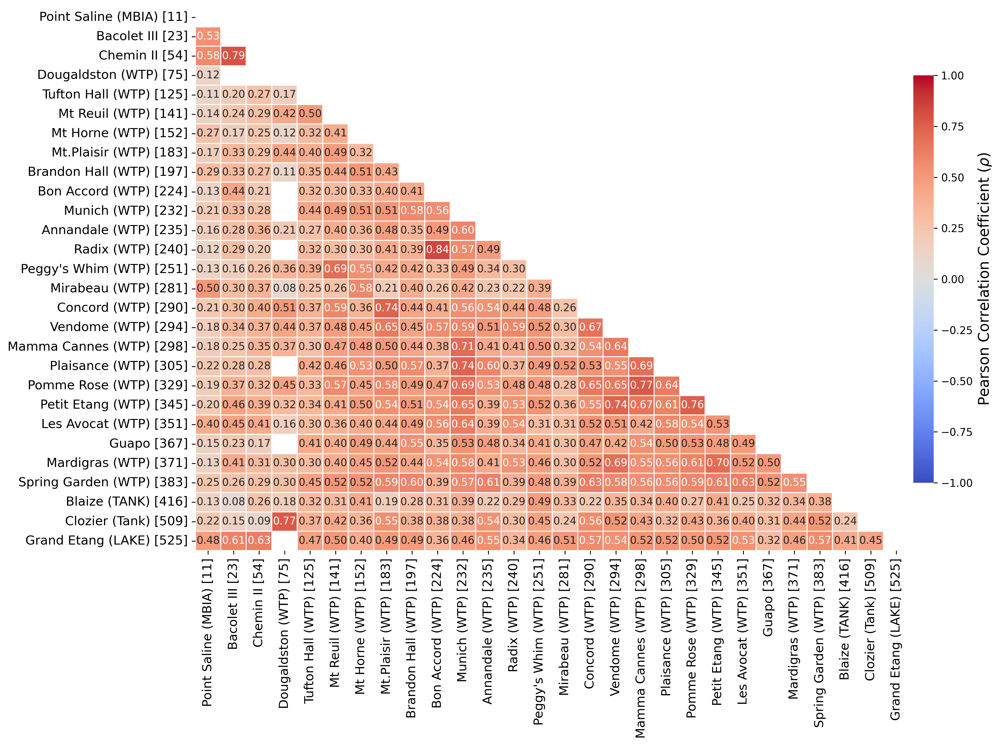

In [11]:
# Select columns and compute correlation
cols_of_interest = stations["station_id"].astype(str).tolist()
df_corr = rainfall_merged[cols_of_interest]
corr = df_corr.corr()

# Get elevation per station_id
elev_map = stations.set_index(stations["station_id"].astype(str))["Elevation"].to_dict()
ordered = sorted(corr.index, key=lambda s: elev_map.get(s, np.nan))
corr_ord = corr.loc[ordered, ordered]

# Upper triangle mask
mask = np.triu(np.ones_like(corr_ord, dtype=bool))
tick_labels = [f"{s} [{int(elev_map.get(s, np.nan))}]" for s in ordered]

plt.figure(figsize=(14, 10), dpi=300)
ax = sns.heatmap(
    corr_ord, mask=mask, cmap="coolwarm", vmin=-1, vmax=1, center=0,
    annot=True, fmt=".2f", linewidths=0.5,
    cbar_kws={"shrink": 0.75, "pad": 0.005}
)
ax.set_xticklabels(tick_labels, rotation=90, fontsize = 12)
ax.set_yticklabels(tick_labels, rotation=0, fontsize = 12)
cbar = ax.collections[0].colorbar
cbar.set_label(r'Pearson Correlation Coefficient ($\rho$)', fontsize=14)
plt.tight_layout()
plt.show()

## 3.2 Station-Covariate Correlation matrix

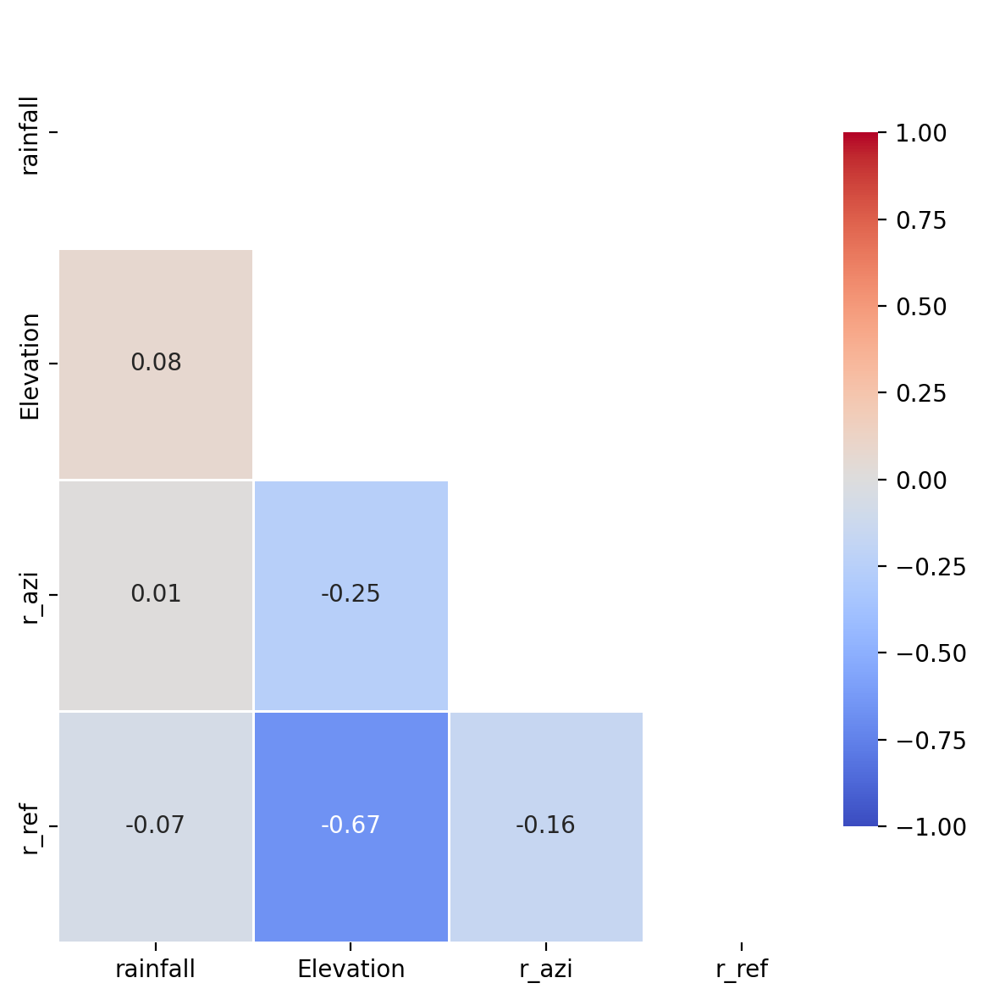

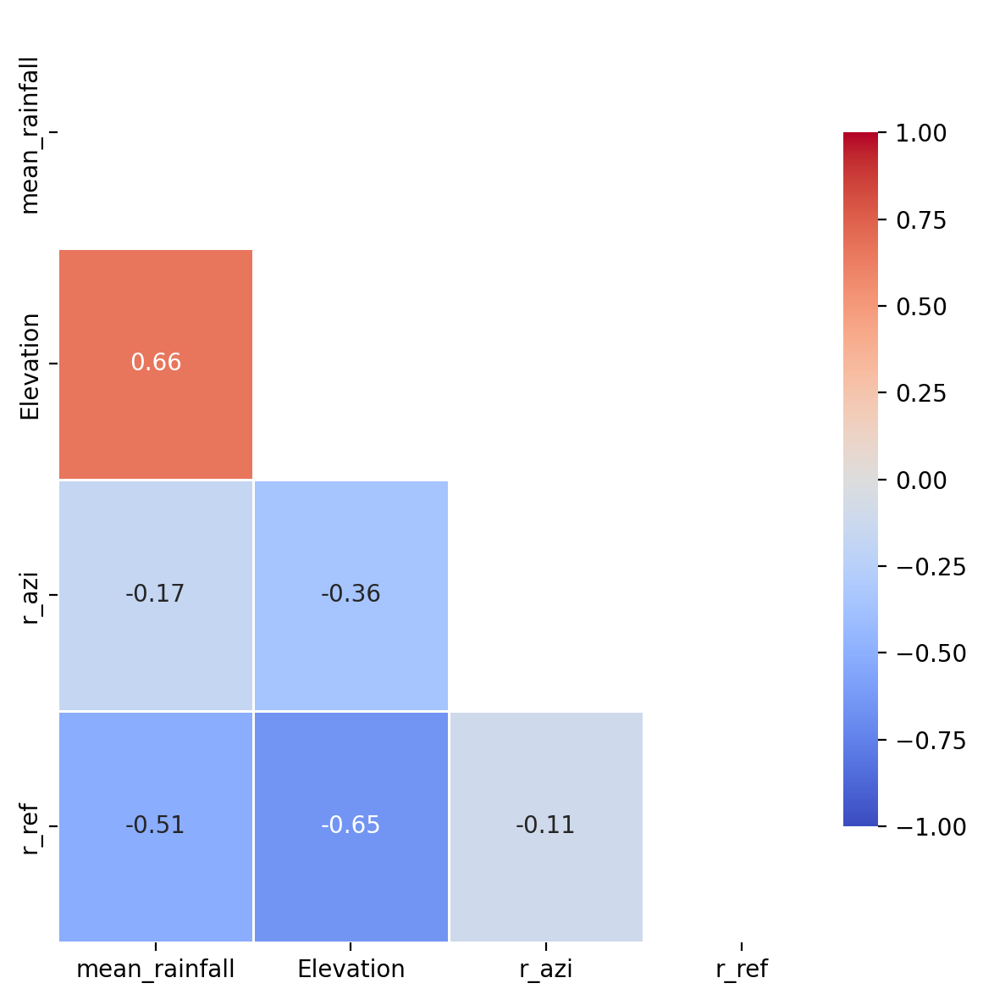

In [12]:
# filter long dataframe <2005
rainfall_2005 = rainfall_long[rainfall_long["date"] >= "2005-01-01"].reset_index(drop=True)
rainfall_2005 = rainfall_2005[rainfall_2005["rainfall"].notna()]

# only keep date_id with n >= 25
counts = rainfall_2005.groupby("date_id")["rainfall"].count()
valid_dates = counts[counts >= 25].index
rainfall_before_2005_filtered = rainfall_2005[rainfall_2005["date_id"].isin(valid_dates)].reset_index(drop=True)

# create correlation matrix vs. elevation
# columns of interest and correlation computation
cols_of_interest = ["rainfall","Elevation","r_azi","r_ref"]
df_corr = rainfall_before_2005_filtered[cols_of_interest]
corr = df_corr.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

# Plot
plt.figure(figsize=(6, 6), dpi = 200)
heatmap = sns.heatmap(
    corr,
    mask=mask,
    cmap='coolwarm',
    center=0,
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    cbar_kws={"shrink": 0.75,
              "pad": 0.005}
)
ax.set_xticklabels(tick_labels,fontsize = 12)
ax.set_yticklabels(tick_labels, fontsize = 12)
cbar = ax.collections[0].colorbar
cbar.set_label(r'Pearson Correlation Coefficient ($\rho$)', fontsize=14)
plt.tight_layout()
# plt.savefig('correlation_features.png')
plt.show()

# Compute mean rainfall per station
station_means = rainfall_before_2005_filtered.groupby("station_id")["rainfall"].mean()
station_meta = stations[["station_id", "Elevation", "r_azi","r_ref"]].set_index("station_id")
df_station = station_means.to_frame("mean_rainfall").join(station_meta)

# Correlation matrix
corr = df_station.corr()

# Plot
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(6, 6), dpi=200)
sns.heatmap(
    corr,
    mask=mask,
    cmap="coolwarm",
    annot=True,
    fmt=".2f",
    vmin=-1,
    vmax=1,
    linewidths=0.5,
    cbar_kws={"shrink": 0.75,
              "pad": 0.005}
)
plt.tight_layout()
plt.show()

# 4.0 Traditional Variogram/Correlation model Estimation

$$
\text{rainfall\_norm}_i
=
\frac{x_i - \mu}{\sigma},
\qquad
\mu = \frac{1}{N}\sum_{i=1}^{N} x_i,
\qquad
\sigma = \sqrt{\frac{1}{N}\sum_{i=1}^{N} (x_i - \mu)^2 }.
$$

$$
\text{rainfall\_norm}_i
=
\frac{x_i - \mu}{\sigma}
$$

## 4.1 Create standard dataset

In [13]:
rainfall_norm = rainfall_before_2005_filtered.copy()

# Normalization: Global mean and standard deviation
global_mean = rainfall_norm["rainfall"].mean()
global_std = rainfall_norm["rainfall"].std()

if global_std == 0:
    global_std = 1

rainfall_norm["rainfall_norm"] = (
    rainfall_norm["rainfall"] - global_mean
) / global_std

## 4.2 Separation distance

Fitting groups:   0%|          | 0/785 [00:00<?, ?it/s]

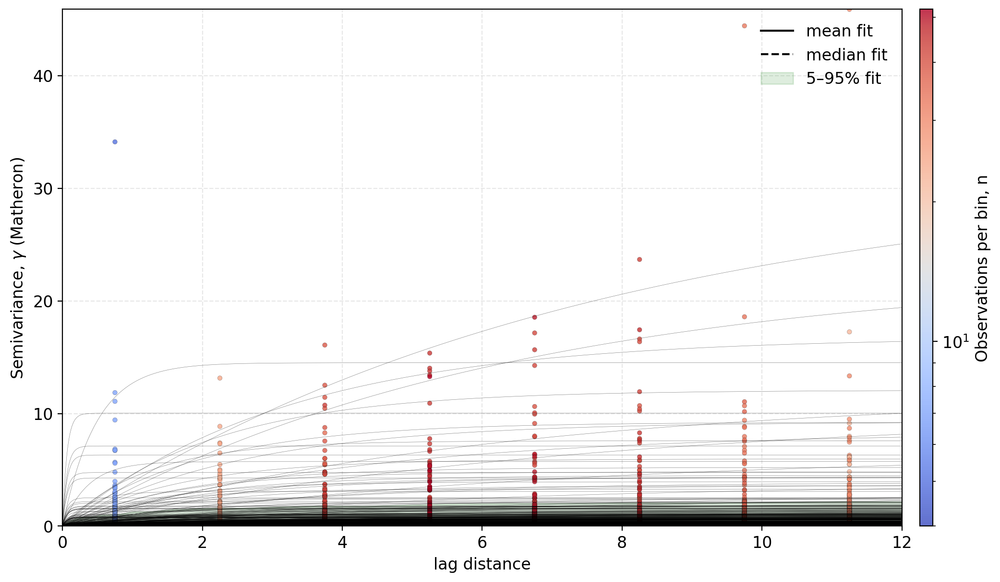

In [14]:
estimator = "Matheron"
model = "exponential"
weight_fn = "exponential weighting"
weight_params = [6]
xmax_factor = 2
column_label = 'rainfall_norm'

summary, df_n_obs, df_gamma, results = variofitmulti(
    df=rainfall_norm,
    values_col=column_label,
    index_col="date_id",
    coord_cols=("Lat","Lon"),
    distance_type="geographic",
    max_distance=12,
    bin_size=1.5,
    estimator_type=estimator,
    model_type=model,
    weight_fn=weight_fn,
    weight_params=weight_params,
    xmax_factor=xmax_factor,
    fix_sill= False,
    fix_nugget=True,
    plot_single=False,
    plot_summary=True
)

## 4.3 Elevation dissimilarity

Fitting groups:   0%|          | 0/785 [00:00<?, ?it/s]

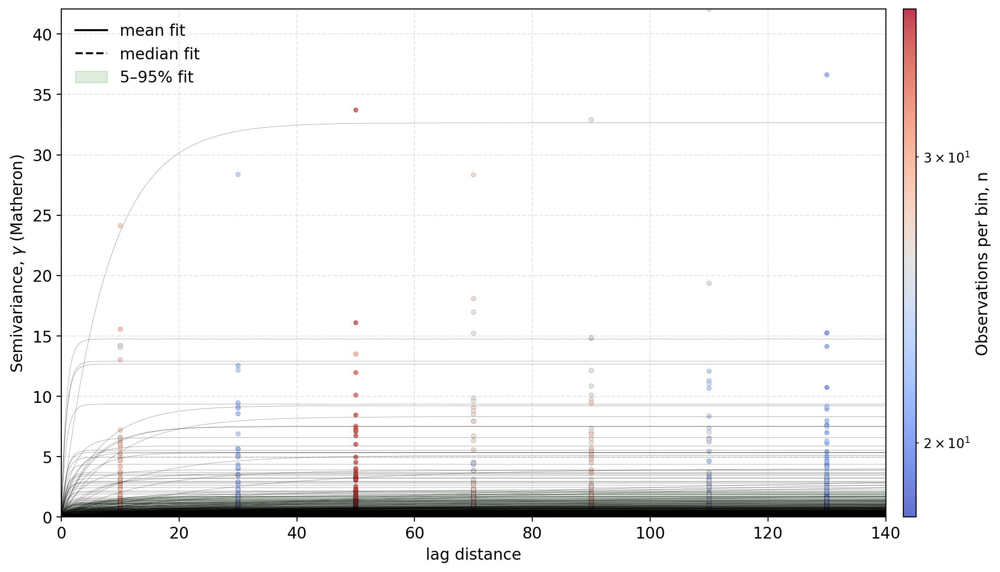

In [15]:
estimator = "Matheron"
model = "exponential"
weight_fn = "exponential weighting"
weight_params = [75]
xmax_factor = 2
column_label = 'rainfall_norm'

summary, df_n_obs, df_gamma, results = variofitmulti(
    df=rainfall_norm,
    values_col=column_label,
    index_col="date_id",
    coord_cols=["Elevation"],
    distance_type="euclidean",
    max_distance=140,
    bin_size=20,
    estimator_type=estimator,
    model_type=model,
    weight_fn=weight_fn,
    weight_params=weight_params,
    xmax_factor=xmax_factor,
    fix_sill= False,
    fix_nugget=True,
    plot_single=False,
    plot_summary=True
)

## 4.4 Non-stationary correlations

In [16]:
months7_12 = {
    "July":   rainfall_norm[rainfall_norm["date"].dt.month == 7],
    "August": rainfall_norm[rainfall_norm["date"].dt.month == 8],
    "September": rainfall_norm[rainfall_norm["date"].dt.month == 9],
    "October":   rainfall_norm[rainfall_norm["date"].dt.month == 10],
    "November":  rainfall_norm[rainfall_norm["date"].dt.month == 11],
    "December":  rainfall_norm[rainfall_norm["date"].dt.month == 12],
}

months = {
    "January":   rainfall_norm[rainfall_norm["date"].dt.month == 1],
    "February":  rainfall_norm[rainfall_norm["date"].dt.month == 2],
    "March":     rainfall_norm[rainfall_norm["date"].dt.month == 3],
    "April":     rainfall_norm[rainfall_norm["date"].dt.month == 4],
    "May":       rainfall_norm[rainfall_norm["date"].dt.month == 5],
    "June":      rainfall_norm[rainfall_norm["date"].dt.month == 6],
    "July":      rainfall_norm[rainfall_norm["date"].dt.month == 7],
    "August":    rainfall_norm[rainfall_norm["date"].dt.month == 8],
    "September": rainfall_norm[rainfall_norm["date"].dt.month == 9],
    "October":   rainfall_norm[rainfall_norm["date"].dt.month == 10],
    "November":  rainfall_norm[rainfall_norm["date"].dt.month == 11],
    "December":  rainfall_norm[rainfall_norm["date"].dt.month == 12],
}

### 4.4.1 All data: Separation distance, h

Station pairs:   0%|          | 0/377 [00:00<?, ?it/s]

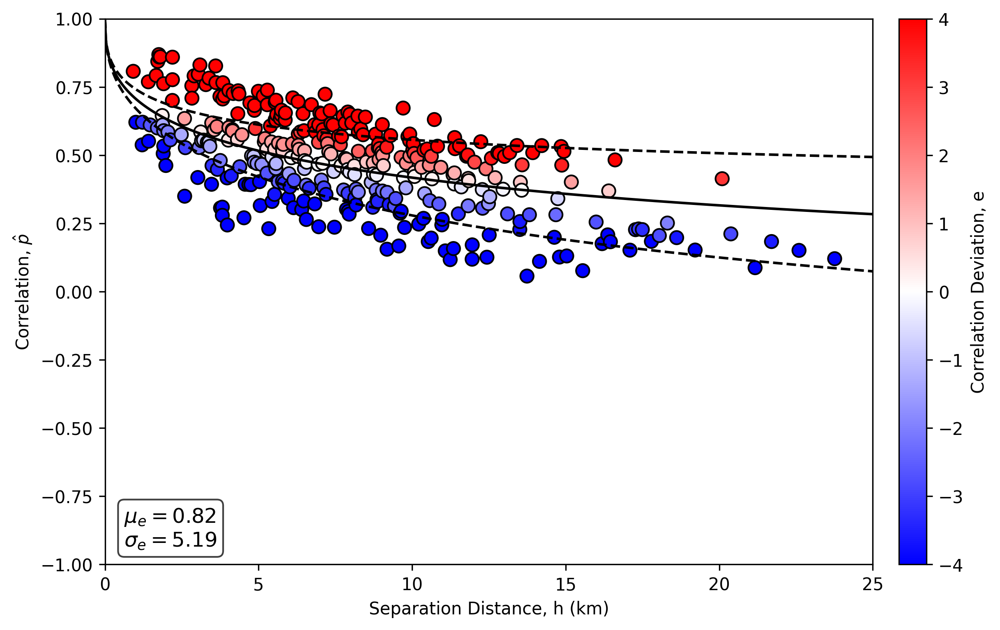

In [17]:
cbb21 = cossim(rainfall_norm, 6, hmax=25)
lE_test = 14.02
gE_test = 0.40
nugget_test = 0

# correlation model
dh = np.linspace(0,25,1000)
p_dh = np.exp(-1*(dh/lE_test)**gE_test)-nugget_test
p = np.exp(-1*(cbb21.h/lE_test)**gE_test)-nugget_test
z_p = 0.5*np.log((1+p)/(1-p))
e = (cbb21.z_p_hat - z_p)*np.sqrt(cbb21.n_j-2)
e_mean = np.nanmean(e)
e_std = np.nanstd(e)
p_std = np.square(1-p_dh)/np.sqrt(6)

# plot
fig, ax = plt.subplots(figsize = (8,5), dpi = 300, constrained_layout=True)
im = ax.scatter(cbb21.h,cbb21.p_hat, c = e, vmin = -4, vmax = 4, cmap = 'bwr', edgecolors = 'black', s = 60)
plt.plot(dh,p_dh,'-k')
plt.plot(dh,p_dh - p_std,'--k')
plt.plot(dh,p_dh + p_std,'--k')
plt.xlim(0, max(dh))
plt.ylim(-1,1)
ax.set_ylabel(r'Correlation, $\hat{p}$')
ax.set_xlabel('Separation Distance, h (km)')
textstr = '\n'.join((rf'$\mu_e={e_mean:.2f}$', rf'$\sigma_e={e_std:.2f}$'))
ax.text(0.025, 0.025, textstr, fontsize=12, verticalalignment='bottom',transform=ax.transAxes,
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.75))
fig.colorbar(im, ax=ax, label = 'Correlation Deviation, e',aspect = 20, pad = 0.02)
plt.show()

### 4.4.2 Monthly Rainfall: Separation distance

#### 4.4.2.1 All months

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/377 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

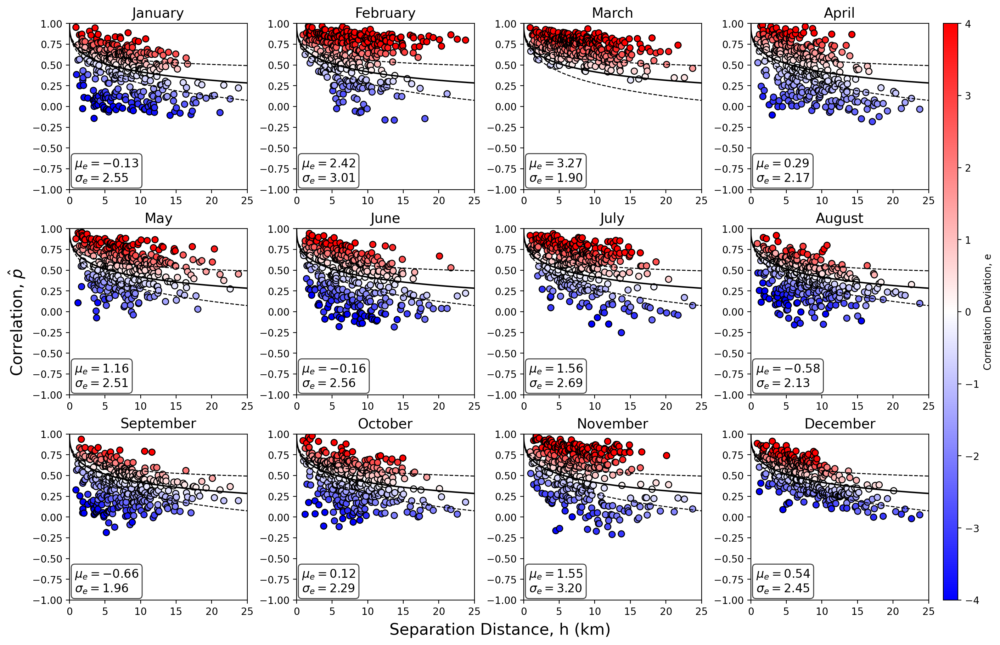

In [18]:
# correlation model parameters
lE_test = 14.02
gE_test = 0.40
nugget_test = 0

fig, axes = plt.subplots(
    3, 4,
    figsize=(14, 9),
    dpi=200,
    constrained_layout=True
)

axes = axes.ravel()

# Precompute model curve
dh = np.linspace(0, 25, 1000)
p_dh = np.exp(-1 * (dh / lE_test)**gE_test) - nugget_test
p_std = np.square(1 - p_dh) / np.sqrt(6)

# Loop through months
for ax, month in zip(axes, months):

    df = months[month]

    # non-stationary correlations
    cbb21 = cossim(df, 6, hmax=25)

    # model predictions at empirical h
    p = np.exp(-1 * (cbb21.h / lE_test)**gE_test) - nugget_test
    z_p = 0.5 * np.log((1 + p) / (1 - p))

    # deviations
    e = (cbb21.z_p_hat - z_p) * np.sqrt(cbb21.n_j - 2)
    e_mean = np.nanmean(e)
    e_std = np.nanstd(e)

    # scatter
    im = ax.scatter(
        cbb21.h, cbb21.p_hat,
        c=e,
        vmin=-4, vmax=4,
        cmap="bwr",
        edgecolors="black",
        s=40
    )

    # model curves
    ax.plot(dh, p_dh, "-k", lw=1.5)
    ax.plot(dh, p_dh - p_std, "--k", lw=1)
    ax.plot(dh, p_dh + p_std, "--k", lw=1)

    # axes
    ax.set_xlim(0, 25)
    ax.set_ylim(-1, 1)
    ax.set_title(month, fontsize=14)
    # ax.grid(True, linestyle="--", alpha=0.3)

    # text box
    textstr = (
        rf"$\mu_e={e_mean:.2f}$" + "\n" +
        rf"$\sigma_e={e_std:.2f}$"
    )
    ax.text(
        0.03, 0.03,
        textstr,
        transform=ax.transAxes,
        fontsize=12,
        verticalalignment="bottom",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.75)
    )

# Shared labels
fig.supxlabel("Separation Distance, h (km)", fontsize=16)
fig.supylabel(r"Correlation, $\hat{p}$", fontsize=16)

# Shared colorbar
cbar = fig.colorbar(
    im,
    ax=axes,
    orientation="vertical",
    # fraction=0.025,
    aspect=40,
    pad=0.01,
    label="Correlation Deviation, e"
)
plt.show()

#### 4.4.2.1 Wettest months: July, August, September, October, November and December

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/350 [00:00<?, ?it/s]

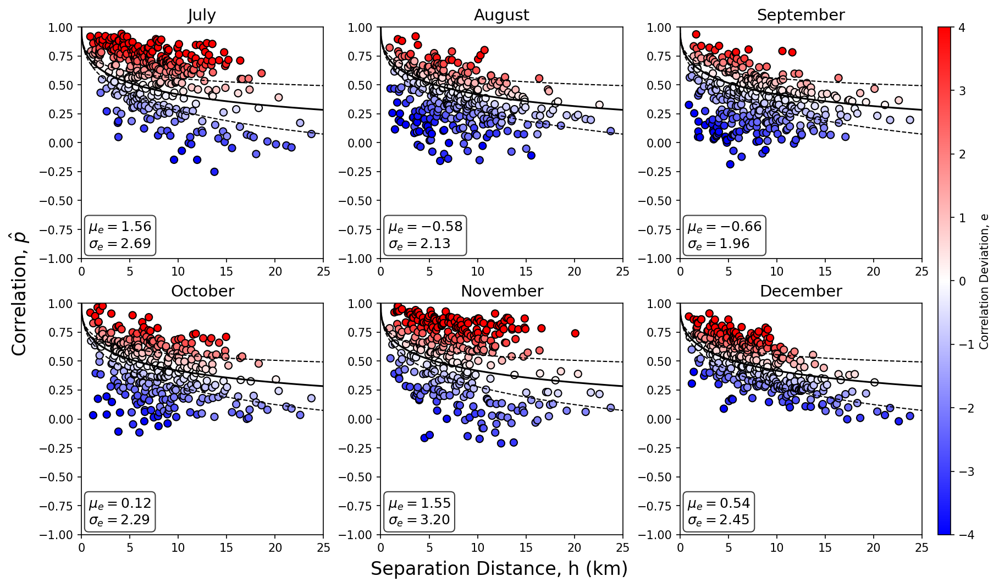

In [19]:
# correlation model parameters
lE_test = 14.02
gE_test = 0.40
nugget_test = 0

fig, axes = plt.subplots(
    2, 3,
    figsize=(12, 7),
    dpi=150,
    constrained_layout=True
)

axes = axes.ravel()

# Precompute model curve
dh = np.linspace(0, 25, 1000)
p_dh = np.exp(-1 * (dh / lE_test)**gE_test) - nugget_test
p_std = np.square(1 - p_dh) / np.sqrt(6)

# Loop through months
for ax, month in zip(axes, months7_12):

    df = months7_12[month]

    # non-stationary correlations
    cbb21 = cossim(df, 6, hmax=25)

    # model predictions at empirical h
    p = np.exp(-1 * (cbb21.h / lE_test)**gE_test) - nugget_test
    z_p = 0.5 * np.log((1 + p) / (1 - p))

    # deviations
    e = (cbb21.z_p_hat - z_p) * np.sqrt(cbb21.n_j - 2)
    e_mean = np.nanmean(e)
    e_std = np.nanstd(e)

    # scatter
    im = ax.scatter(
        cbb21.h, cbb21.p_hat,
        c=e,
        vmin=-4, vmax=4,
        cmap="bwr",
        edgecolors="black",
        s=40
    )

    # model curves
    ax.plot(dh, p_dh, "-k", lw=1.5)
    ax.plot(dh, p_dh - p_std, "--k", lw=1)
    ax.plot(dh, p_dh + p_std, "--k", lw=1)

    # axes
    ax.set_xlim(0, 25)
    ax.set_ylim(-1, 1)
    ax.set_title(month, fontsize=14)
    # ax.grid(True, linestyle="--", alpha=0.3)

    # text box
    textstr = (
        rf"$\mu_e={e_mean:.2f}$" + "\n" +
        rf"$\sigma_e={e_std:.2f}$"
    )
    ax.text(
        0.03, 0.03,
        textstr,
        transform=ax.transAxes,
        fontsize=12,
        verticalalignment="bottom",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.75)
    )

# Shared labels
fig.supxlabel("Separation Distance, h (km)", fontsize=16)
fig.supylabel(r"Correlation, $\hat{p}$", fontsize=16)

# Shared colorbar
cbar = fig.colorbar(
    im,
    ax=axes,
    orientation="vertical",
    # fraction=0.025,
    aspect=40,
    pad=0.01,
    label="Correlation Deviation, e"
)
plt.show()

#### 4.4.2.3 Sites on opposing elevations

Station pairs:   0%|          | 0/36 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/42 [00:00<?, ?it/s]

Station pairs:   0%|          | 0/49 [00:00<?, ?it/s]

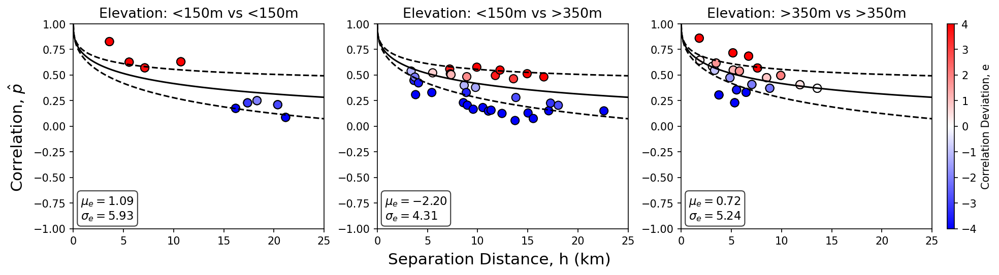

In [20]:
ref_sta_low1 = stations[stations.Elevation < 150].station_id.tolist()
ref_sta_high1 = stations[stations.Elevation > 350].station_id.tolist()

scenarios = {
    "Elevation: <150m vs <150m": (ref_sta_low1, ref_sta_low1),
    "Elevation: <150m vs >350m": (ref_sta_low1, ref_sta_high1),
    "Elevation: >350m vs >350m": (ref_sta_high1, ref_sta_high1),
}

# correlation model parameters
lE_test = 14.02
gE_test = 0.40
nugget_test = 0

# model curve (same for all panels)
dh = np.linspace(0, 25, 1000)
p_dh = np.exp(-1 * (dh / lE_test)**gE_test) - nugget_test
p_std = np.square(1 - p_dh) / np.sqrt(6)

fig, axes = plt.subplots(
    1, 3,
    figsize=(13, 3.5),
    dpi=150,
    constrained_layout=True
)

for ax, (title, (sta_i, sta_j)) in zip(axes, scenarios.items()):

    # compute correlations
    cbb21 = cossim(
        rainfall_norm,
        6,
        hmax=25,
        sta_i=sta_i,
        sta_j=sta_j
    )

    # model predictions at empirical h
    p = np.exp(-1 * (cbb21.h / lE_test)**gE_test) - nugget_test
    z_p = 0.5 * np.log((1 + p) / (1 - p))

    # deviations
    e = (cbb21.z_p_hat - z_p) * np.sqrt(cbb21.n_j - 2)
    e_mean = np.nanmean(e)
    e_std = np.nanstd(e)

    # scatter
    im = ax.scatter(
        cbb21.h,
        cbb21.p_hat,
        c=e,
        vmin=-4,
        vmax=4,
        cmap="bwr",
        edgecolors="black",
        s=60
    )

    # model curves
    ax.plot(dh, p_dh, "-k")
    ax.plot(dh, p_dh - p_std, "--k")
    ax.plot(dh, p_dh + p_std, "--k")

    # axes
    ax.set_xlim(0, 25)
    ax.set_ylim(-1, 1)
    ax.set_title(title, fontsize=13)

    # remove individual axis labels
    ax.set_xlabel("")
    ax.set_ylabel("")

    # text box
    textstr = (
        rf"$\mu_e={e_mean:.2f}$" + "\n" +
        rf"$\sigma_e={e_std:.2f}$"
    )
    ax.text(
        0.03, 0.03,
        textstr,
        transform=ax.transAxes,
        fontsize=11,
        verticalalignment="bottom",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.75)
    )

# Shared master labels
fig.supxlabel("Separation Distance, h (km)", fontsize=15)
fig.supylabel(r"Correlation, $\hat{p}$", fontsize=15)

# Shared colorbar
cbar = fig.colorbar(
    im,
    ax=axes,
    orientation="vertical",
    aspect=30,
    pad=0.01,
    label="Correlation Deviation, e"
)
plt.show()

# 5.0 Bayesian MCMC Inference Correlation Models

## 5.1 Import modules

In [21]:
import arviz as az
import numpyro as numpyro
print('numpyro v' + str(numpyro.__version__))
import jax as jax
print('jax v' + str(jax.__version__))

# # Change JAX default from float32 to float64
jax.config.update("jax_enable_x64", True)

# Import some functions directly for convenience
import jax.numpy as jnp
import numpyro.distributions as dist
from numpyro.infer import MCMC, NUTS, Predictive, log_likelihood
from scipy.special import logsumexp

numpyro.set_platform("cpu")

# Number of CPUs -> To sample several MCMC chains in parallel
numpyro.set_host_device_count(4)

numpyro.enable_validation(True)

numpyro v0.18.0
jax v0.5.3


## 5.2 Define Distance functions and Models

### 5.2.1 Distance functions

#### 5.2.1.1 Euclidean distance

$$
d_{ij}
=
\sqrt{
    r_i^{\,2}
    + r_j^{\,2}
    - 2\, r_i r_j \cos\!\left( \theta_i - \theta_j \right)
},
\qquad
d_{ii} = 0.
$$

In [22]:
def getEucDistanceFromPolar(X):
    sq_dist = (jnp.square(jnp.reshape(X[:,0],[-1,1])) +
               jnp.square(jnp.reshape(X[:,0],[1,-1])) -
        2 * (jnp.reshape(X[:,0],[-1,1]) * jnp.reshape(X[:,0],[1,-1])) *
        jnp.cos(jnp.abs(jnp.reshape(X[:,1],[1,-1]) - jnp.reshape(X[:,1],[-1,1]) )) )
    sq_dist = jnp.clip(sq_dist, 0, np.inf)
    dist = jnp.sqrt(sq_dist)
    dist = dist.at[jnp.diag_indices_from(dist)].set(0.0)
    return dist

#### 5.2.1.2 Elevation distance

$$
d_{\mathrm{Elev},ij} = |Elev_{i}-Elev_{j}|
$$

In [23]:
def getElevationDissimilarity(X):
    sq_dist = jnp.square(jnp.reshape(X[:,2], [-1,1]) - jnp.reshape(X[:,2], [1,-1]))
    sq_dist = jnp.clip(sq_dist, 0, np.inf)
    dist = jnp.sqrt(sq_dist)
    return dist

### 5.2.2 Models

#### 5.2.2.1 Model E (separation distance only)

$$
K_{ij}
=
\exp\!\left(
    -\left( \frac{ d_{ij} }{ L_E } \right)^{\gamma_E}
\right)
\;+\;
\eta\,\mathbf{1}_{\{i=j\}}.
$$

$$
d_{ij} = \text{EuclideanDistance}(X_i, X_j),
\qquad
\eta = \text{nugget}.
$$

In [24]:
# Deterministic correlation functions
def rhoE(X, LEt, gammaE, nugget = 1e-6):
    distE = getEucDistanceFromPolar(X)
    K = jnp.exp(-1.0 * jnp.multiply(jnp.power(distE, gammaE), 1.0/LEt))

    K = K.at[jnp.diag_indices(X.shape[0])].add(nugget)
    return K

# Probabilistic correlation model
def modelE(X, eqids, z):
    # Define Prior Distributions
    LE = numpyro.sample("LE", dist.InverseGamma(concentration=2, rate=15))
    gamma2 = numpyro.sample("gamma2", dist.Beta(2,2))

    # Compute transformed parameters
    gammaE = numpyro.deterministic("gammaE", 2.0*gamma2)
    LEt = numpyro.deterministic("LEt", jnp.power(LE, gammaE))

    # # Nugget standard deviation prior
    # nugget_sd = numpyro.sample("nugget_sd", dist.HalfCauchy(2.5))
    # nugget = numpyro.deterministic("nugget", jnp.square(nugget_sd))

    # Specify observational model for each event
    z = [numpyro.sample("z_{}".format(eqid),
              dist.MultivariateNormal(0, rhoE(X[i], LEt, gammaE)),
              obs = z[i]) for i,eqid in enumerate(eqids)]

#### 5.2.2.2 Model EElev (elevation and separation distance)

$$
K_{ij}
=
\exp\!\left(
    -\left( \frac{ d_{ij} }{ L_E } \right)^{\gamma_E}
\right)
\;
\exp\!\left(
    -\,\frac{ \Delta h_{ij} }{ L_{\text{elev}} }
\right)
\;+\;
\eta\,\mathbf{1}_{\{i=j\}}.
$$

$$
d_{ij} = \text{EuclideanDistance}(X_i, X_j),
\qquad
\Delta h_{ij} = \text{ElevationDissimilarity}(X_i, X_j),
\qquad
\eta = \text{nugget}.
$$

In [25]:
def rhoEElev(X, LEt, gammaE, LElev, nugget = 1e-6):

    distE = getEucDistanceFromPolar(X)
    KE = jnp.exp(-1.0 * jnp.multiply(jnp.power(distE, gammaE), 1.0/LEt))

    distElev = getElevationDissimilarity(X)
    KElev = jnp.exp(-1.0 * jnp.multiply(distElev, 1.0/LElev))

    K = KE*KElev
    K = K.at[jnp.diag_indices(X.shape[0])].add(nugget)
    return K

def modelEElev(X, eqids, z):
    # Define Prior Distributions
    LE = numpyro.sample("LE", dist.InverseGamma(concentration=2, rate=15))
    gamma2 = numpyro.sample("gamma2", dist.Beta(2,2))
    LElev = numpyro.sample("LElev", dist.InverseGamma(2, 30))

    # Compute transformed parameters
    gammaE = numpyro.deterministic("gammaE", 2.0*gamma2)
    LEt = numpyro.deterministic("LEt", jnp.power(LE, gammaE))

    # # Nugget standard deviation prior
    # nugget_sd = numpyro.sample("nugget_sd", dist.HalfCauchy(2.5))
    # nugget = numpyro.deterministic("nugget", jnp.square(nugget_sd))

    # Specify observational model for each event
    z = [numpyro.sample("z_{}".format(eqid),
              dist.MultivariateNormal(0, rhoEElev(X[i], LEt, gammaE, LElev)),
              obs = z[i]) for i,eqid in enumerate(eqids)]

## 5.3 LOO-CV function

In [26]:
def compute_pooled_loo(idata, pointwise=True):
    # Concatenate all log_likelihood variables
    log_lik_vars = [idata.log_likelihood[v] for v in idata.log_likelihood.data_vars]
    log_lik_concat = xr.concat(log_lik_vars, dim="obs_id")

    # Create a copy of idata with the replaced log_likelihood
    idata_copy = idata.copy()
    idata_copy.log_likelihood = xr.Dataset({"log_lik": log_lik_concat})

    # Compute LOO
    loo_result = az.loo(idata_copy, var_name="log_lik", pointwise=pointwise)
    return loo_result

## 5.4 Total Dataset Distribution across months

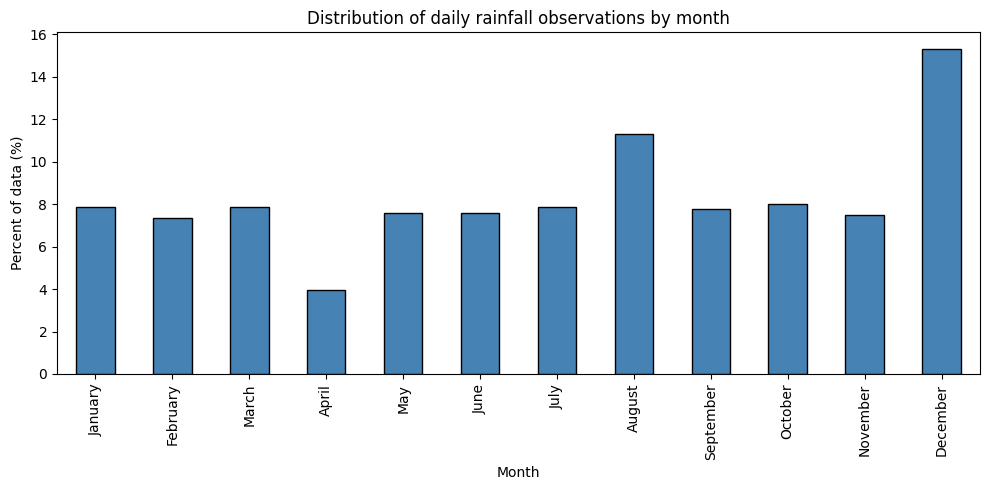

In [27]:
# Extract month number and month name
rainfall_norm["month"] = rainfall_norm["date"].dt.month
rainfall_norm["month_name"] = rainfall_norm["date"].dt.month_name()

# Count values per month (using month number for correct ordering)
month_counts = (
    rainfall_norm
    .groupby("month")["month"]
    .count()
)

# Convert to percent
month_percent = month_counts / month_counts.sum() * 100

# Replace index with month names for plotting
month_percent.index = month_percent.index.map(lambda m: pd.to_datetime(str(m), format="%m").strftime("%B"))

# Plot
plt.figure(figsize=(10, 5))
month_percent.plot(kind="bar", color="steelblue", edgecolor="black")

plt.ylabel("Percent of data (%)")
plt.xlabel("Month")
plt.title("Distribution of daily rainfall observations by month")
plt.tight_layout()
plt.show()

## 5.5 Bayesian Inference and evaluation: Dtot

### 5.5.1 Create dataset (Dtot)

In [115]:
# get all dateids
eqids = rainfall_norm["date_id"].unique().tolist()

# create training dataset
Xtot = []; ztot = []
for eqid in eqids:
  group = rainfall_norm[rainfall_norm.date_id==eqid].copy()
  Xtot.append(group[['r_ref','r_azi','Elevation']].values)
  ztot.append(group['rainfall_norm'].values)

train_data = dict(X=Xtot, eqids=eqids, z=ztot)

### 5.5.2 Run Bayesian MCMC Parameter estimation

In [116]:
# Choose separate seeds for each model
rng = np.random.default_rng(31)
seeds = rng.integers(0, 100000, 2)

results = []
predictions = []
lppds = []

models = [modelE, modelEElev]

for m, seed in zip(models, seeds):
  # Specify model and MCMC parameters
  model = MCMC(NUTS(m), num_warmup=1000, num_samples=1000, num_chains=4)

  # Run MCMC
  model.run(jax.random.PRNGKey(seed), **train_data)

  # Generate Posterior Predictive Samples
  predictive = Predictive(m, posterior_samples=model.get_samples())
  post_pred_samples = predictive(jax.random.PRNGKey(seed),  **train_data)

  # Store samples
  results.append(model.get_samples())

  # For post-processing with arviz use
  idata = az.from_numpyro(model,posterior_predictive=post_pred_samples, log_likelihood = True)
  predictions.append(idata)

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

### 5.5.3 Post-processing

#### 5.5.3.1 Trace plot checks

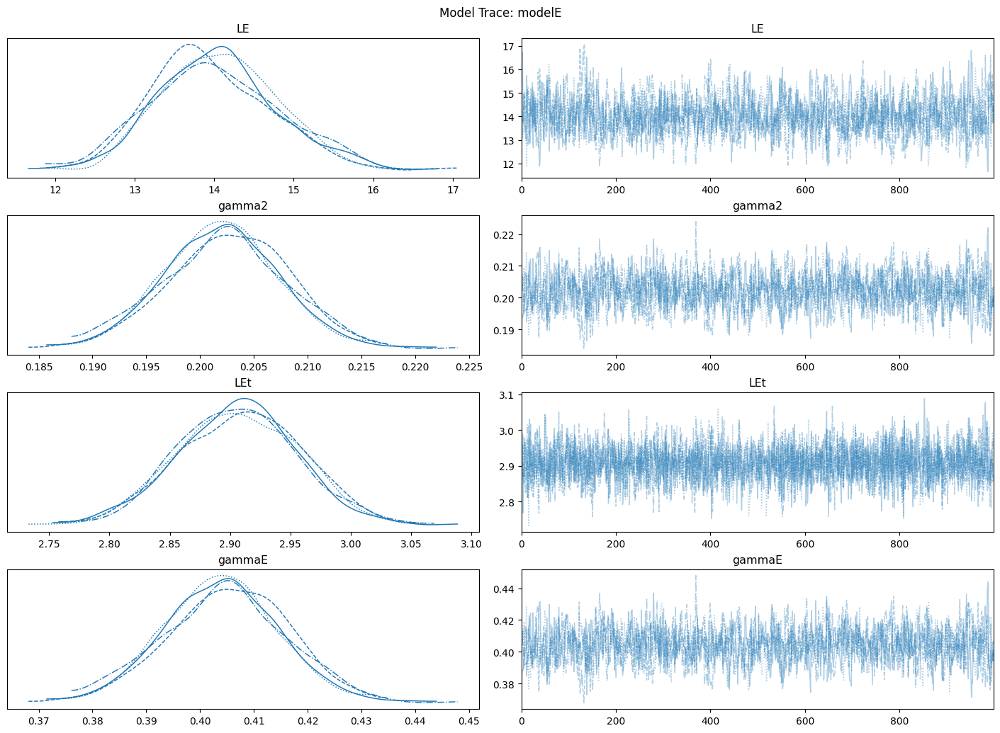

modelE


,mean,sd,hdi_3%,hdi_97%
LE,14.028,0.786,12.653,15.552
gamma2,0.202,0.005,0.192,0.213
LEt,2.907,0.050,2.811,2.999
gammaE,0.404,0.011,0.384,0.425


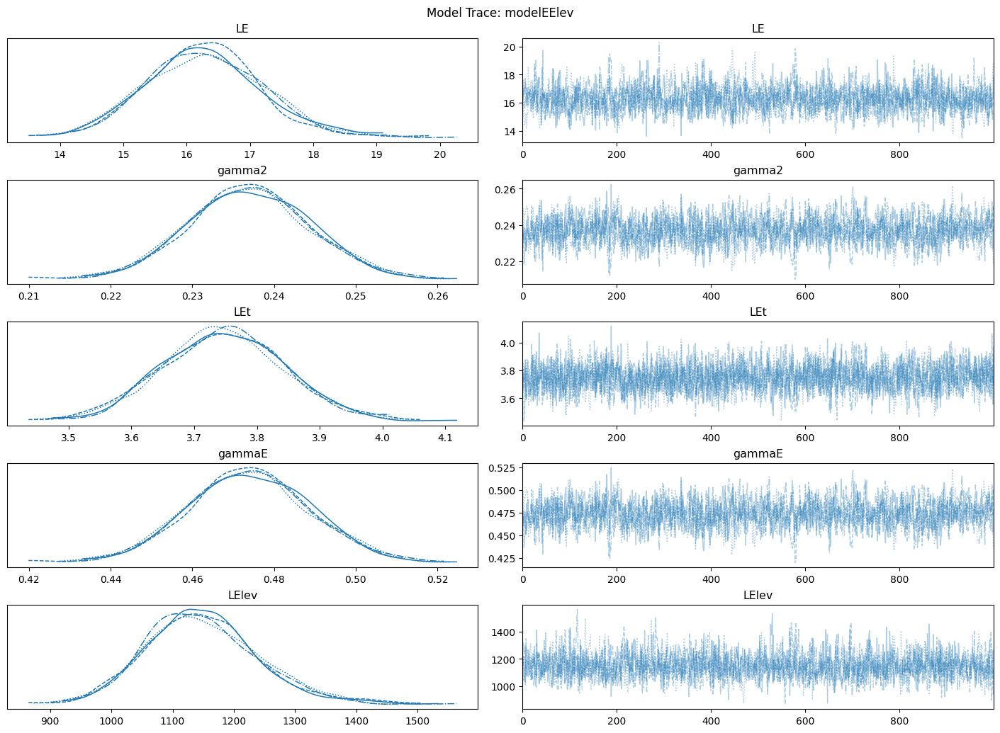

modelEElev


,mean,sd,hdi_3%,hdi_97%
LE,16.287,0.922,14.520,17.953
gamma2,0.237,0.007,0.224,0.251
LEt,3.748,0.096,3.574,3.930
gammaE,0.474,0.015,0.447,0.502
LElev,1148.311,91.692,969.220,1311.862


In [117]:
plt.rcParams['figure.constrained_layout.use'] = True
plt.close('all')

names = ["modelE", "modelEElev", "modelEAElev"]

# choose what to show (adjust per model)
globals_E      = ["LE", "gamma2", "LEt", "gammaE"]
globals_EElev  = ["LE", "gamma2", "LEt", "gammaE", "LElev"]
var_lists = [globals_E, globals_EElev]

for name, idata, vars_to_plot in zip(names, predictions, var_lists):
    # Trace (posterior only), compact layout, show divergences
    az.plot_trace(
        idata,
        var_names=vars_to_plot,
        kind="trace",
        compact=True,
        divergences=True,
        figsize=(14, 10),
    )
    plt.suptitle(f"Model Trace: {name}", y=1.02)
    plt.show()

    # Optional: quick summary table
    print(name)
    display(az.summary(idata, var_names=vars_to_plot, kind="stats"))

#### 5.5.3.2 LOO-CV

C:\Users\test\Desktop\python_venv\pyvenv_gen312\Lib\site-packages\arviz\stats\stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
C:\Users\test\Desktop\python_venv\pyvenv_gen312\Lib\site-packages\arviz\stats\stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


            rank      elpd_loo       p_loo   elpd_diff    weight           se  \
modelEElev     0 -22158.875750  113.047010    0.000000  0.790713  1012.248517   
modelE         1 -22315.021619   99.725848  156.145869  0.209287  1007.479104   

                  dse  warning scale  
modelEElev   0.000000     True   log  
modelE      67.712728     True   log  


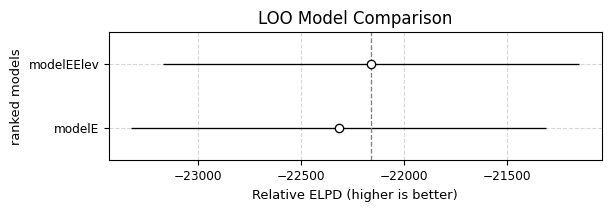

In [118]:
# Loop over your prediction objects and compute LOO
loos = []
for idata in predictions:
    loo = compute_pooled_loo(idata, pointwise=True)
    # az.plot_khat(loo)
    # plt.show()
    loos.append(loo)

# Model names must be in same order
model_names = ['modelE', 'modelEElev']

# Compare all models
compare_df = az.compare({m: l for m, l in zip(model_names, loos)})

# Print the comparison table
print(compare_df)

az.plot_compare(compare_df)
plt.title("LOO Model Comparison")
plt.xlabel("Relative ELPD (higher is better)")
plt.grid(True, which="both", linestyle="--", alpha=0.5)
plt.show()

#### 5.5.3.3 Export posteriors

In [119]:
export_directory = Path(r'Outputs\SCM_params')
export_params = True

# specify variables to export
# vars = [
#     ["LE", "gammaE", "nugget"],
#     ["LE", "gammaE", "LElev", "nugget"],
#     ["LE", "gammaE", "LElev", "LA", "w", "nugget"],
# ]
vars = [
    ["LE", "gammaE"],
    ["LE", "gammaE", "LElev"],
    ["LE", "gammaE", "LElev", "LA", "w"],
]

df_param_samples = [pd.DataFrame(res)[var]
                    for res, var in zip(results, vars)]

if export_params:
    df_param_samples[0].to_csv(export_directory.joinpath('GRN_DAILY_MODEL_E_n25_full.csv'), index=False)
    df_param_samples[1].to_csv(export_directory.joinpath('GRN_DAILY_MODEL_EElev_n25_full.csv'), index=False)

    # # Nugget versions
    # df_param_samples[0].to_csv(export_directory.joinpath('GRN_DAILY_MODEL_En.csv'), index=False)
    # df_param_samples[1].to_csv(export_directory.joinpath('GRN_DAILY_MODEL_EElevn.csv'), index=False)

#### 5.5.3.4 Prediction accuracy

$$
\text{LPPD}(m)
=
-\log S
+
\log\!\left(
\sum_{s=1}^{S}
\exp\!\left[
\sum_{i=1}^{N_{\text{test}}}
\log p\!\left(z_i \mid \theta^{(s)}, m\right)
\right]
\right),
$$

$$
\text{LPPD}_{\text{ind}}
=
-\frac{1}{2}
\left(
N_{\text{test}}\log(2\pi)
+
\sum_{i=1}^{N_{\text{test}}} z_i^{2}
\right),
$$

$$
\text{RelDiff}(m)
=
\left(
1 -
\frac{\text{LPPD}(m)}{\text{LPPD}_{\text{ind}}}
\right)\times 100\%.
$$

In [120]:
Xtot_test = []; ztot_test = []
for eqid in eqids:
  group = rainfall_norm[rainfall_norm.date_id==eqid].copy()
  Xtot_test.append(group[['r_ref','r_azi','Elevation']].values)
  ztot_test.append(group['rainfall_norm'].values)

test_data = dict(X=Xtot_test, eqids=eqids, z=ztot_test)

# compute log-likelihood
n_r = len(df_param_samples[0])
loglik = [pd.DataFrame(log_likelihood(m, res, **test_data))
            for res, m in zip(results, models)]
loglik_tot = [np.sum(LL.values, axis=1) for LL in loglik]
LPPD = [-np.log(n_r) + logsumexp(LL) for LL in loglik_tot]

# Array with observations from both events in the test data set.
ztot_test = np.hstack(test_data['z'])
LPPD_ind = (-0.5 * (len(ztot_test)*np.log(2*np.pi)
                + np.sum(ztot_test**2)))

rel_diff = [(1-lppd/LPPD_ind)*100 for lppd in LPPD]
print(f'Rel. difference in LPPD [%] model E: {rel_diff[0]}')
print(f'Rel. difference in LPPD [%] model EE: {rel_diff[1]}')

# export LPPDs across each date
loglik[0].to_csv(export_directory.joinpath(r'GRN_DAILY_MODEL_LPPDE_E.csv'), index=False)
loglik[1].to_csv(export_directory.joinpath(r'GRN_DAILY_MODEL_LPPDE_EElev.csv'), index=False)

Rel. difference in LPPD [%] model E: 23.384109636404837
Rel. difference in LPPD [%] model EE: 23.943304234247652


## 5.6 Bayesian Inference: Date-specific

In [123]:
rng = np.random.default_rng(91)
seeds = rng.integers(0, 100000, len(eqids))

n_recs = rainfall_norm['date_id'].value_counts().rename('n_recs')

# dataframe for storage
df_es = pd.DataFrame()
df_es = pd.DataFrame({'date_id': eqids})
df_es = df_es.merge(n_recs, left_on='date_id', right_index=True)

# lists for storage
lppds = []
LE = []
gE = []

for i, eqid in enumerate(eqids):

    clear_output(wait=True)  # Clears previous output (nice for progress updates)
    print(f"Processing event {i+1}/{len(eqids)}: {eqid}")

    seed = seeds[i]

    Xtot = []; ztot = []
    group = rainfall_norm[rainfall_norm.date_id==eqid].copy()
    Xtot = [group[['r_ref','r_azi','Elevation']].values]
    ztot = [group['rainfall_norm'].values]
    train_data = dict(X=Xtot, eqids=[eqid], z=ztot)

    # Specify model and MCMC parameters
    model = MCMC(NUTS(modelE), num_warmup=1000, num_samples=1000, num_chains=4)

    # Run MCMC
    model.run(jax.random.PRNGKey(seed), **train_data)

    # Generate Posterior Predictive Samples
    predictive = Predictive(modelE, posterior_samples=model.get_samples())
    # post_pred_samples = predictive(jax.random.PRNGKey(seed),  **train_data)

    # Store samples
    samples = model.get_samples()
    LE.append(np.mean(samples['LE']))
    gE.append(np.mean(samples['gammaE']))

    # Compute log-likelihood for each sample
    cond_loglik = log_likelihood(modelE, samples, **train_data)['z_' + str(eqid)]

    # Compute Log-posterior predictive (LPPD)
    lppds.append(-np.log(4000) + logsumexp(jax.device_get(cond_loglik)))

df_es['LPPD'] = lppds
df_es['LE'] = LE
df_es['gE'] = gE
df_es.to_csv(export_directory / "GRN_DAILY_MODELE_LPPDPES.csv", index=False)

Processing event 785/785: 20251231


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

## 5.7 Bayesian Inference: Group by month

In [ ]:
# Choose separate seeds for each model
rng = np.random.default_rng(31)
model_name = ['modelE', 'modelEElev']
models = [modelE, modelEElev]

pooled_summary_all = []
monthly_summaries = []

for month in rainfall_norm.month_name.unique():
    clear_output(wait=True)
    print(f"Month: {month}")

    # get all dateids per month
    rainfall_norm_month = rainfall_norm[rainfall_norm.month_name==month].reset_index(drop=True)
    eqids = rainfall_norm_month["date_id"].unique().tolist()

    # create training dataset per month
    Xtot = []; ztot = []
    for eqid in eqids:
      group = rainfall_norm_month[rainfall_norm_month.date_id==eqid].copy()
      Xtot.append(group[['r_ref','r_azi','Elevation']].values)
      ztot.append(group['rainfall_norm'].values)
    train_data = dict(X=Xtot, eqids=eqids, z=ztot)

    # generate new seed per month per model
    seeds = rng.integers(0, 100000, len(model_name))

    results = []
    predictions = []
    lppds = []

    for m, seed in zip(models, seeds):
      # Specify model and MCMC parameters
      model = MCMC(NUTS(m), num_warmup=1000, num_samples=1000, num_chains=4)

      # Run MCMC
      model.run(jax.random.PRNGKey(seed), **train_data)

      # Generate Posterior Predictive Samples
      predictive = Predictive(m, posterior_samples=model.get_samples())
      post_pred_samples = predictive(jax.random.PRNGKey(seed),  **train_data)

      # Store samples
      results.append(model.get_samples())

      # For post-processing with arviz use
      idata = az.from_numpyro(model,posterior_predictive=post_pred_samples, log_likelihood = True)
      predictions.append(idata)

    # Loo summary check
    # Compute LOO
    loos = []
    for idata in predictions:
        loo = compute_pooled_loo(idata, pointwise=True)
        loos.append(loo)

    compare_df = az.compare({m: l for m, l in zip(model_name, loos)})
    print(compare_df)
    compare_df.to_csv(export_directory / f"monthly_params/GRN_DAILY_LOOCompare_{month}.csv", index=True)

    # save results
    vars = [
        ["LE", "gammaE"],
        ["LE", "gammaE", "LElev"]
    ]

    df_param_samples = [pd.DataFrame(res)[var]
                        for res, var in zip(results, vars)]

    df_param_samples[0].to_csv(export_directory.joinpath(f'monthly_params/GRN_DAILY_MODEL_E_n25_{month}.csv'), index=False)
    df_param_samples[1].to_csv(export_directory.joinpath(f'monthly_params/GRN_DAILY_MODEL_EElev_n25_{month}.csv'), index=False)

    # compute likelihoods
    loglik = [pd.DataFrame(log_likelihood(m, res, **train_data))
                for res, m in zip(results, models)]

    loglik[0].to_csv(export_directory.joinpath(rf'monthly_params/GRN_DAILY_MODEL_LPPDE_E_{month}.csv'), index=False)
    loglik[1].to_csv(export_directory.joinpath(rf'monthly_params/GRN_DAILY_MODEL_LPPDE_EElev_{month}.csv'), index=False)

    # Pooled models
    n_r = len(df_param_samples[0])
    loglik_tot = [np.sum(LL.values, axis=1) for LL in loglik]
    LPPD = [-np.log(n_r) + logsumexp(LL) for LL in loglik_tot]

    ztot = np.hstack(train_data['z'])
    LPPD_ind = (-0.5 * (len(ztot)*np.log(2*np.pi)
                        + np.sum(ztot**2)))

    rel_diff = [(1-lppd/LPPD_ind)*100 for lppd in LPPD]

    loglikpool = pd.DataFrame({
            'model': model_name,
            'month': [month] * len(model_name),
            'LPPD': LPPD,
            'rel_diff': rel_diff
    })
    pooled_summary_all.append(loglikpool)

    # parameter summary
    month_summary = {"month": month}
    for model_name_i, var_list, res in zip(model_name, vars, results):
        df = pd.DataFrame(res)[var_list]
        for col in df.columns:
            month_summary[f"{model_name_i}_{col}"] = df[col].mean()
            month_summary[f"{model_name_i}_{col}_med"] = df[col].median()
            month_summary[f"{model_name_i}_{col}_5"] = df[col].quantile(0.05)
            month_summary[f"{model_name_i}_{col}_95"] = df[col].quantile(0.95)
    monthly_summaries.append(month_summary)

df_month_summary = pd.DataFrame(monthly_summaries)
df_month_summary.to_csv(export_directory / f"monthly_params/GRN_DAILY_param_summary_month.csv", index=False)

LPPDP = pd.concat(pooled_summary_all, ignore_index=True)
LPPDP.to_csv(export_directory / f"monthly_params/GRN_DAILY_LPPDP_month.csv", index=False)

## 5.8 Bayesian Inference evaluation

### 5.8.1 Load and parse data

In [28]:
lppd_directory = Path(r'Outputs/SCM_params')

# Pooled LPPDs across months
LPPDP_reldiff = pd.read_csv(lppd_directory/'GRN_DAILY_LPPDP_month.csv')

# event-specific LPPDPs
LPPDPES = pd.read_csv(lppd_directory/'GRN_DAILY_MODELE_LPPDPES.csv')
LPPDPES["date_id"] = LPPDPES["date_id"].astype(str)
rainfall_unique = (rainfall_norm[["date_id", "month", "month_name"]].drop_duplicates().reset_index(drop=True))
rainfall_unique["date_id"] = rainfall_unique["date_id"].astype(str)
LPPDPES = LPPDPES.merge(rainfall_unique, on="date_id", how="left")
LPPDPES = LPPDPES.sort_values("month").reset_index(drop=True)
order = LPPDPES['date_id']

# pooled LPPDs by month
frames = []

for month in rainfall_norm.month_name.unique():
    pooled_ME_LPPDE = pd.read_csv(
        lppd_directory / f"monthly_params/GRN_DAILY_MODEL_LPPDE_E_{month}.csv"
    )
    pooled_MEElev_LPPDE = pd.read_csv(
        lppd_directory / f"monthly_params/GRN_DAILY_MODEL_LPPDE_EElev_{month}.csv"
    )

    cols_E = [c for c in pooled_ME_LPPDE.columns if str(c).startswith("z_")]
    cols_EElev = [c for c in pooled_MEElev_LPPDE.columns if str(c).startswith("z_")]

    temp = pd.DataFrame({
        "date_id": [c.replace("z_", "") for c in cols_E],
        "E": logsumexp(pooled_ME_LPPDE[cols_E].to_numpy(), axis=0) - np.log(len(pooled_ME_LPPDE)),
        "EElev": logsumexp(pooled_MEElev_LPPDE[cols_EElev].to_numpy(), axis=0) - np.log(len(pooled_MEElev_LPPDE)),
    })

    temp["date_id"] = temp["date_id"].astype(str)
    temp["month_name"] = month   # optional
    frames.append(temp)

PO_LPPDE_month = pd.concat(frames, ignore_index=True)

# optional: enforce your preferred order
PO_LPPDE_month = (
    PO_LPPDE_month
    .set_index("date_id")
    .loc[order]
    .reset_index()
)

# pooled LPPDs
PO_LPPD_E = pd.read_csv(lppd_directory / "GRN_DAILY_MODEL_LPPDE_E.csv")
PO_LPPD_EElev = pd.read_csv(lppd_directory / "GRN_DAILY_MODEL_LPPDE_EElev.csv")

cols_E = [c for c in PO_LPPD_E.columns if str(c).startswith("z_")]
cols_EElev = [c for c in PO_LPPD_EElev.columns if str(c).startswith("z_")]

PO_LPPDE = pd.DataFrame({
    "date_id": [c.replace("z_", "") for c in cols_E],
    "E_pooled": logsumexp(PO_LPPD_E[cols_E].to_numpy(), axis=0) - np.log(len(PO_LPPD_E)),
    "EElev_pooled": logsumexp(PO_LPPD_EElev[cols_EElev].to_numpy(), axis=0) - np.log(len(PO_LPPD_EElev)),
})

PO_LPPDE["date_id"] = PO_LPPDE["date_id"].astype(str)
PO_LPPDE = PO_LPPDE.merge(rainfall_unique, on="date_id", how="left")

### 5.8.2 Pooled Performance

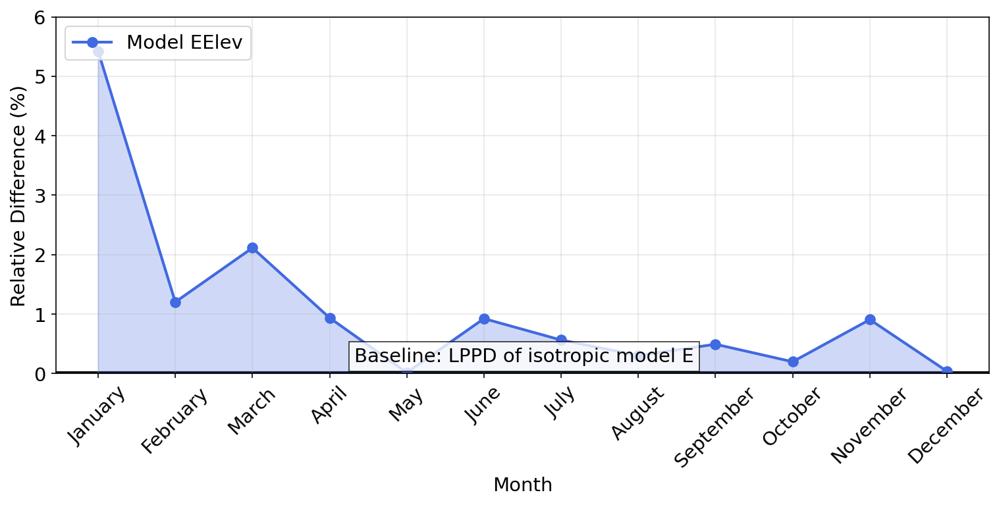

In [29]:
df = LPPDP_reldiff.pivot(
    index="month",
    columns="model",
    values="rel_diff"
).reset_index()

df["diff"] = (df["modelEElev"] - df["modelE"])

month_order = [
    "January","February","March","April","May","June",
    "July","August","September","October","November","December"
]
df["month"] = pd.Categorical(df["month"], categories=month_order, ordered=True)
df = df.sort_values("month")

fig, ax = plt.subplots(figsize=(10, 5), dpi=150, constrained_layout=True)

ax.plot(
    df["month"],
    df["diff"],
    marker="o",
    linestyle="-",
    color="royalblue",
    linewidth=2,
    markersize=7,
    label = 'Model EElev'
)
ax.fill_between(
    df["month"],
    0,
    df["diff"],
    color="royalblue",
    alpha=0.25
)
ax.axhline(y=0, xmin=0.001, xmax=6, linestyle='-', color='black', linewidth=3, zorder=0)
ax.text(3.32, 0.2, 'Baseline: LPPD of isotropic model E',
            fontsize=14,
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='black', linewidth=0.8))

ax.set_xticks(df["month"])
ax.set_xticklabels(df["month"], rotation=45)

ax.set_xlabel("Month", fontsize=14)
ax.set_ylabel("Relative Difference (%)", fontsize=14)
ax.legend(loc='upper left', fontsize=14, frameon=True, framealpha=0.8)
ax.set_ylim([0,6])
ax.tick_params(labelsize = 14)
ax.grid(alpha=0.3)
plt.show()

### 5.8.3 Event-specific

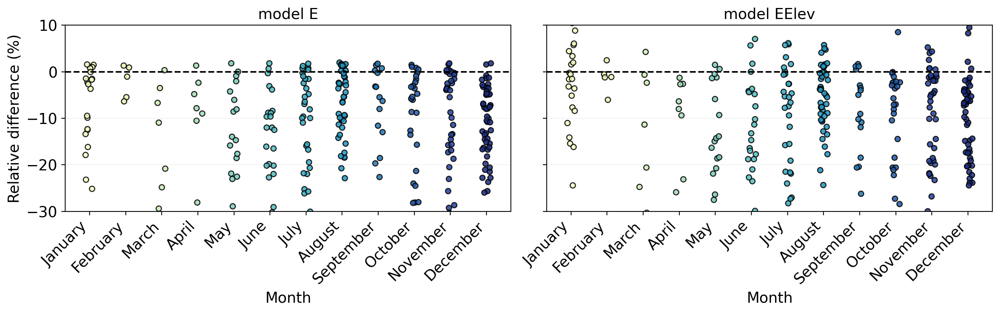

In [31]:
RD_LPPDES = (
    LPPDPES[["date_id", "LPPD", "n_recs"]]
    .rename(columns={"LPPD": "LPPD_eventE"})
    .copy()
)

RD_LPPDES["date_id"] = RD_LPPDES["date_id"].astype(str)
PO_LPPDE["date_id"] = PO_LPPDE["date_id"].astype(str)
PO_LPPDE_month["date_id"] = PO_LPPDE_month["date_id"].astype(str)

# merge full pooled comparison
RD_LPPDES = RD_LPPDES.merge(
    PO_LPPDE,
    on="date_id",
    how="left",
    validate="one_to_one",
)

# merge month-specific pooled comparison
RD_LPPDES = RD_LPPDES.merge(
    PO_LPPDE_month[["date_id", "E", "EElev"]].rename(
        columns={
            "E": "E_month_pooled",
            "EElev": "EElev_month_pooled",
        }
    ),
    on="date_id",
    how="left",
    validate="one_to_one",
)

# positive means event-specific E is better than the pooled comparator
RD_LPPDES["RD_E"] = 100.0 * (
    1.0 - RD_LPPDES["E_pooled"] / RD_LPPDES["LPPD_eventE"]
)

RD_LPPDES["RD_EElev"] = 100.0 * (
    1.0 - RD_LPPDES["EElev_pooled"] / RD_LPPDES["LPPD_eventE"]
)

# positive means event-specific E is better than the month-specific pooled comparator
RD_LPPDES["RD_E_month"] = 100.0 * (
    1.0 - RD_LPPDES["E_month_pooled"] / RD_LPPDES["LPPD_eventE"]
)

RD_LPPDES["RD_EElev_month"] = 100.0 * (
    1.0 - RD_LPPDES["EElev_month_pooled"] / RD_LPPDES["LPPD_eventE"]
)

# plot
month_order = (
    RD_LPPDES[["month", "month_name"]]
    .dropna()
    .drop_duplicates()
    .sort_values("month")
)

fig, ax = plt.subplots(
    1, 2, figsize=(13, 4), dpi=200,
    sharey=True, constrained_layout=True
)

rng = np.random.default_rng(123)

# ordered, muted palette for the 12 months
cmap = plt.cm.YlGnBu
month_vals = month_order["month"].to_numpy()
month_colors = {
    m: cmap(v) for m, v in zip(month_vals, np.linspace(0.08, 0.92, len(month_vals)))
}

for i, col in enumerate(["RD_E", "RD_EElev"]):
    for _, row in month_order.iterrows():
        mnum = row["month"]
        mname = row["month_name"]

        y = RD_LPPDES.loc[RD_LPPDES["month"] == mnum, col].dropna().values
        x = mnum + rng.uniform(-0.12, 0.12, size=len(y))

        if len(y) > 0:
            ax[i].scatter(
                x, y,
                s=25,
                alpha=0.85,
                color=month_colors[mnum],
                edgecolors="black"
            )

    ax[i].axhline(0, linestyle="--", linewidth=1.5, color="black")
    ax[i].set_xticks(month_order["month"])
    ax[i].set_xticklabels(month_order["month_name"], rotation=45, ha="right")
    ax[i].set_xlabel("Month", fontsize=14)
    ax[i].set_ylim(-30, 10)
    ax[i].tick_params(labelsize=14)
    ax[i].grid(axis="y", alpha=0.2, linewidth=0.6)

ax[0].set_ylabel("Relative difference (%)", fontsize=14)
ax[0].set_title('model E', fontsize=14)
ax[1].set_title('model EElev', fontsize=14)
plt.show()

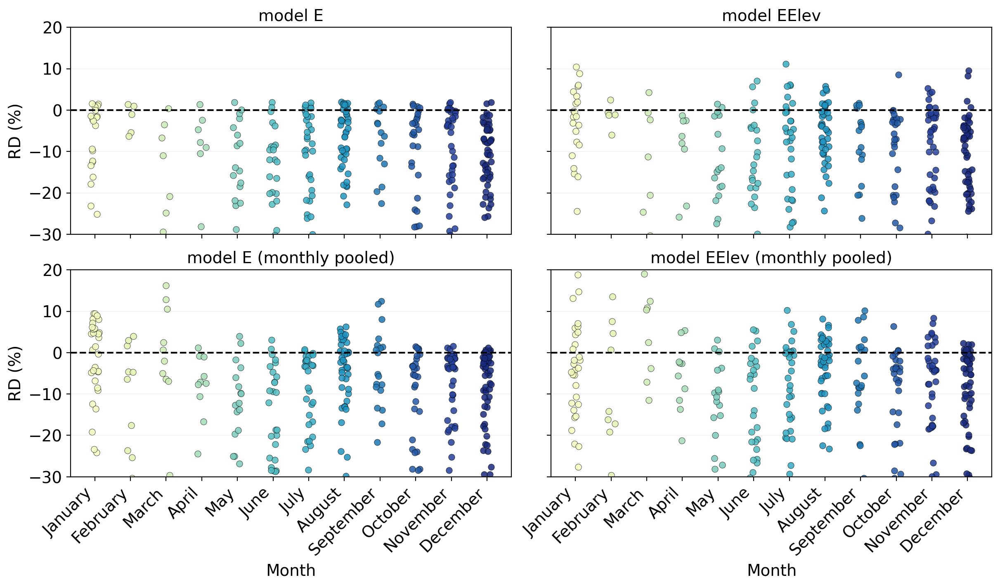

In [33]:
month_order = (
    RD_LPPDES[["month", "month_name"]]
    .dropna()
    .drop_duplicates()
    .sort_values("month")
)

fig, ax = plt.subplots(
    2, 2, figsize=(12, 7), dpi=200,
    sharex=True, sharey=True, constrained_layout=True
)

rng = np.random.default_rng(123)

# ordered palette for the 12 months
cmap = plt.cm.YlGnBu
month_vals = month_order["month"].to_numpy()
month_colors = {
    m: cmap(v) for m, v in zip(month_vals, np.linspace(0.08, 0.92, len(month_vals)))
}

plot_cols = [
    ("RD_E", "model E"),
    ("RD_EElev", "model EElev"),
    ("RD_E_month", "model E (monthly pooled)"),
    ("RD_EElev_month", "model EElev (monthly pooled)"),
]

for axi, (col, title) in zip(ax.ravel(), plot_cols):
    for _, row in month_order.iterrows():
        mnum = row["month"]

        y = RD_LPPDES.loc[RD_LPPDES["month"] == mnum, col].dropna().values
        x = mnum + rng.uniform(-0.12, 0.12, size=len(y))

        if len(y) > 0:
            axi.scatter(
                x, y,
                s=30,
                alpha=0.85,
                color=month_colors[mnum],
                edgecolors="black",
                linewidths=0.3,
            )

    axi.axhline(0, linestyle="--", linewidth=1.5, color="black")
    axi.set_xticks(month_order["month"])
    axi.set_xticklabels(month_order["month_name"], rotation=45, ha="right")
    axi.set_ylim(-30, 20)
    axi.tick_params(labelsize=14)
    axi.grid(axis="y", alpha=0.2, linewidth=0.6)
    axi.set_title(title, fontsize=14)

ax[0, 0].set_ylabel("RD (%)", fontsize=14)
ax[1, 0].set_ylabel("RD (%)", fontsize=14)
ax[1, 0].set_xlabel("Month", fontsize=14)
ax[1, 1].set_xlabel("Month", fontsize=14)

plt.show()

# 6.0 Ordinary Krigging (OK)

## 6.1 Load parameters from Bayesian Inference

In [26]:
# load params
# Nugget
modelEn_daily_params = pd.read_csv(r'Outputs/SCM_params/GRN_DAILY_MODEL_En.csv')
modelEELevn_daily_params = pd.read_csv(r'Outputs/SCM_params/GRN_DAILY_MODEL_EELevn.csv')

# No nugget
modelE_daily_params = pd.read_csv(r'Outputs/SCM_params/GRN_DAILY_MODEL_E_n25_full.csv')
modelEELev_daily_params = pd.read_csv(r'Outputs/SCM_params/GRN_DAILY_MODEL_EELev_n25_full.csv')

# monthly params no nugget
monthly_model_params = pd.read_csv(r'Outputs/SCM_params/monthly_params/GRN_DAILY_param_summary_month.csv')

# get length scales: nugget
# model En
modelEn_lE = np.mean(modelEn_daily_params.LE)
modelEn_gE = np.mean(modelEn_daily_params.gammaE)
modelEn_nugget = np.mean(modelEn_daily_params.nugget)

# model EElevn
modelEElevn_lE = np.mean(modelEELevn_daily_params.LE)
modelEElevn_gE = np.mean(modelEELevn_daily_params.gammaE)
modelEElevn_lElev = np.mean(modelEELevn_daily_params.LElev)
modelEElevn_nugget = np.mean(modelEELevn_daily_params.nugget)

# dictionary of values
params_En = dict(lE=modelEn_lE, gE=modelEn_gE, nugget = modelEn_nugget)
params_EEn = dict(lE=modelEElevn_lE, gE=modelEElevn_gE, lElev=modelEElevn_lElev, nugget = modelEElevn_nugget)

# get length scales: no nugget
# model E
modelE_lE = np.mean(modelE_daily_params.LE)
modelE_gE = np.mean(modelE_daily_params.gammaE)

# model EElev
modelEElev_lE = np.mean(modelEELev_daily_params.LE)
modelEElev_gE = np.mean(modelEELev_daily_params.gammaE)
modelEElev_lElev = np.mean(modelEELev_daily_params.LElev)

# dictionary of values
params_E = dict(lE=modelE_lE, gE=modelE_gE)
params_EE = dict(lE=modelEElev_lE, gE=modelEElev_gE, lElev=modelEElev_lElev)

# get length scales: monthly no nugget
month = monthly_model_params["month"]
monthly_modelE_lE = monthly_model_params["modelE_LE"]
monthly_modelE_gE = monthly_model_params["modelE_gammaE"]
monthly_modelEElev_lE = monthly_model_params["modelEElev_LE"]
monthly_modelEElev_gE = monthly_model_params["modelEElev_gammaE"]
monthly_modelEElev_lElev = monthly_model_params["modelEElev_LElev"]

# monthly params as month -> parameter dict
monthly_params_E = {
    str(row["month"]).strip(): dict(
        lE=float(row["modelE_LE"]),
        gE=float(row["modelE_gammaE"])
    )
    for _, row in monthly_model_params.iterrows()
}

monthly_params_EE = {
    str(row["month"]).strip(): dict(
        lE=float(row["modelEElev_LE"]),
        gE=float(row["modelEElev_gammaE"]),
        lElev=float(row["modelEElev_LElev"])
    )
    for _, row in monthly_model_params.iterrows()
}

## 6.2 Evaluate dummy dataset for OK estimates

In [29]:
fake_df, mask_log = make_fake_missing(
    rainfall_before_2005_filtered,
    min_obs=3,         # keep at least 3 observed per day
    mask_frac=0.4,     # mask 40% per day
    random_state=42
)

day_var_fake = (fake_df.groupby("date_id")["rainfall"].var(ddof=1).rename("day_var"))
fake_df = fake_df.merge(day_var_fake, on="date_id", how="left")
fake_df["month"] = pd.to_datetime(fake_df["date"]).dt.month_name()

### 6.2.1 No Nugget models

In [30]:
# Run OK with different models on the same fake-missing dataset
# pooled
pred_E = run_OK_all_days(fake_df, model="E", params=params_E, min_obs=3, predict_observed=True)
pred_E["rainfall_est"] = pred_E["rainfall_est"].clip(lower=0)

pred_EE = run_OK_all_days(fake_df, model="EElev", params=params_EE, min_obs=3, predict_observed=True)
pred_EE["rainfall_est"] = pred_EE["rainfall_est"].clip(lower=0)

# monthly
pred_mE = pd.concat([
    run_OK_all_days(
        fake_df.loc[fake_df["month"] == m].copy(),
        model="E",
        params=monthly_params_E[m],
        min_obs=3,
        predict_observed=True
    )
    for m in sorted(fake_df["month"].dropna().unique())
], ignore_index=True)
pred_mE["rainfall_est"] = pred_mE["rainfall_est"].clip(lower=0)

pred_mEE = pd.concat([
    run_OK_all_days(
        fake_df.loc[fake_df["month"] == m].copy(),
        model="EElev",
        params=monthly_params_EE[m],
        min_obs=3,
        predict_observed=True
    )
    for m in sorted(fake_df["month"].dropna().unique())
], ignore_index=True)
pred_mEE["rainfall_est"] = pred_mEE["rainfall_est"].clip(lower=0)

# Evaluate only where we masked (i.e., true value known)
m_E,   eval_E   = evaluate_imputation(pred_E,   mask_log, label_prefix="E/")
m_EE,  eval_EE  = evaluate_imputation(pred_EE,  mask_log, label_prefix="EElev/")
m_mE,  eval_mE  = evaluate_imputation(pred_mE,  mask_log, label_prefix="mE/")
m_mEE, eval_mEE = evaluate_imputation(pred_mEE, mask_log, label_prefix="mEElev/")

comparison = {**m_E, **m_EE, **m_mE, **m_mEE}
comparison

Ordinary kriging by day:   0%|          | 0/785 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/785 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/30 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/90 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/122 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/57 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/61 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/62 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/60 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/61 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/61 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/59 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/62 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/60 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/30 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/90 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/122 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/57 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/61 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/62 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/60 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/61 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/61 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/59 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/62 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/60 [00:00<?, ?it/s]

{'E/MAE': 4.373909943551976,
 'E/RMSE': 9.482488484495653,
 'E/Bias': 0.060220191641443016,
 'E/N_masked': 7850,
 'E/Corr': 0.728892706403219,
 'EElev/MAE': 4.316145350904344,
 'EElev/RMSE': 9.376617632716922,
 'EElev/Bias': 0.02301563926424645,
 'EElev/N_masked': 7850,
 'EElev/Corr': 0.736241100542992,
 'mE/MAE': 4.402122905147135,
 'mE/RMSE': 9.519056742246738,
 'mE/Bias': 0.06632725652328755,
 'mE/N_masked': 7850,
 'mE/Corr': 0.7263238856668915,
 'mEElev/MAE': 4.351999032359919,
 'mEElev/RMSE': 9.38541459497457,
 'mEElev/Bias': 0.033924487833928624,
 'mEElev/N_masked': 7850,
 'mEElev/Corr': 0.7355116903466399}

### 6.2.2 Nugget models

In [178]:
# Run OK with different models on the same fake-missing dataset
pred_En   = run_OK_all_days(fake_df, model="E",     params=params_En, min_obs=3, predict_observed=True)
pred_En['rainfall_est'] = pred_En['rainfall_est'].clip(lower=0)
pred_EEn  = run_OK_all_days(fake_df, model="EElev", params=params_EEn,  min_obs=3, predict_observed=True)
pred_EEn['rainfall_est'] = pred_EEn['rainfall_est'].clip(lower=0)

# Evaluate only where we masked (i.e., true value known)
m_En,   eval_En   = evaluate_imputation(pred_En,   mask_log, label_prefix="En/")
m_EEn,  eval_EEn  = evaluate_imputation(pred_EEn,  mask_log, label_prefix="EElevn/")

# Collect metrics
comparisonn = {**m_En, **m_EEn}
comparisonn

Ordinary kriging by day:   0%|          | 0/785 [00:00<?, ?it/s]

Ordinary kriging by day:   0%|          | 0/785 [00:00<?, ?it/s]

{'En/MAE': 4.394666608816969,
 'En/RMSE': 9.497599095202784,
 'En/Bias': 0.06853371129148712,
 'En/N_masked': 7850,
 'En/Corr': 0.7276480653062504,
 'EElevn/MAE': 4.328901129801062,
 'EElevn/RMSE': 9.383182268434433,
 'EElevn/Bias': 0.036385045620575894,
 'EElevn/N_masked': 7850,
 'EElevn/Corr': 0.7355059918335242}

## 6.3 Compute OK Estimates and variance

### 6.3.1 Model E (no nugget)

In [179]:
# compute daily variance
day_var = (rainfall_long.groupby("date_id")["rainfall"].var(ddof=1).rename("day_var"))

result_E = run_OK_all_days(
    rainfall_long,
    model="E",
    params=params_E,
    min_obs=6,
    predict_observed=True
)

result_E = result_E.merge(day_var, on="date_id", how="left")

# get variance ratios
var_thr = 1  # threshold for treating day_var as ~0
day_var  = result_E["day_var"].to_numpy(float)
rain_var = result_E["rainfall_var"].to_numpy(float)
isfinite_day  = np.isfinite(day_var)
isfinite_rain = np.isfinite(rain_var)

# Masks
is_zero_day  = isfinite_day  & (np.abs(day_var) <= var_thr)
is_pos_day   = isfinite_day  & (day_var > var_thr)
is_zero_rain = isfinite_rain & (rain_var == 0)

# get variance ratio of predicted values to daily variance
result_E["var_ratio"] = np.nan
result_E.loc[is_zero_day, "var_ratio"] = 0.0
result_E.loc[is_zero_rain, "var_ratio"] = 0.0
normal_mask = is_pos_day & (~is_zero_rain)
result_E.loc[normal_mask, "var_ratio"] = rain_var[normal_mask] / day_var[normal_mask]

Ordinary kriging by day:   0%|          | 0/14885 [00:00<?, ?it/s]

### 6.3.2 Model EElev (no nugget)

In [180]:
# compute daily variance
day_var = (rainfall_long.groupby("date_id")["rainfall"].var(ddof=1).rename("day_var"))

result_EElev = run_OK_all_days(
    rainfall_long,
    model="EElev",
    params=params_EE,
    min_obs=6,
    predict_observed=True
)
result_EElev = result_EElev.merge(day_var, on="date_id", how="left")

# get variance ratios
var_thr = 1  # threshold for treating day_var as ~0
day_var  = result_EElev["day_var"].to_numpy(float)
rain_var = result_EElev["rainfall_var"].to_numpy(float)
isfinite_day  = np.isfinite(day_var)
isfinite_rain = np.isfinite(rain_var)

# Masks
is_zero_day  = isfinite_day  & (np.abs(day_var) <= var_thr)
is_pos_day   = isfinite_day  & (day_var > var_thr)
is_zero_rain = isfinite_rain & (rain_var == 0)

# get variance ratio of predicted values to daily variance
result_EElev["var_ratio"] = np.nan
result_EElev.loc[is_zero_day, "var_ratio"] = 0.0
result_EElev.loc[is_zero_rain, "var_ratio"] = 0.0
normal_mask = is_pos_day & (~is_zero_rain)
result_EElev.loc[normal_mask, "var_ratio"] = rain_var[normal_mask] / day_var[normal_mask]

Ordinary kriging by day:   0%|          | 0/14885 [00:00<?, ?it/s]

## 6.4 Remove high-variance values and convert to wide format

In [185]:
# variance to standard deviation
result_E['rainfall_std'] = np.sqrt(result_E['rainfall_var'])
result_EElev['rainfall_std'] = np.sqrt(result_EElev['rainfall_var'])

# remove standard deviations > 25mm
result_E_filt = result_E.copy()
mask = (result_E_filt.rainfall_std > 25) & (result_E_filt.var_ratio > 0.25)
result_E_filt.loc[mask, ["rainfall_est", "var_ratio"]] = np.nan

result_EElev_filt = result_EElev.copy()
mask2 = (result_EElev_filt.rainfall_std > 25) & (result_EElev_filt.var_ratio > 0.25)
result_EElev_filt.loc[mask2, ["rainfall_est", "var_ratio"]] = np.nan

# recreate wide dataframe
rainfall_est_wide_E = result_E_filt[["date", "station_id", "rainfall_est"]].copy().pivot(
    index="date",
    columns="station_id",
    values="rainfall_est"
)
rainfall_est_wide_E = rainfall_est_wide_E.sort_index(axis=1).reset_index()

rainfall_est_wide_EElev = result_EElev_filt[["date", "station_id", "rainfall_est"]].copy().pivot(
    index="date",
    columns="station_id",
    values="rainfall_est"
)
rainfall_est_wide_EElev = rainfall_est_wide_EElev.sort_index(axis=1).reset_index()

export = False

if export:
    result_E.to_csv(r'Outputs\GRN_RAINFALL_MODELE_LONGFORMAT_UNFILT_n6.csv',index=False)
    result_EElev.to_csv(r'Outputs\GRN_RAINFALL_MODELELEV_LONGFORMAT_UNFILT_n6.csv',index=False)

## 6.5 Data completeness

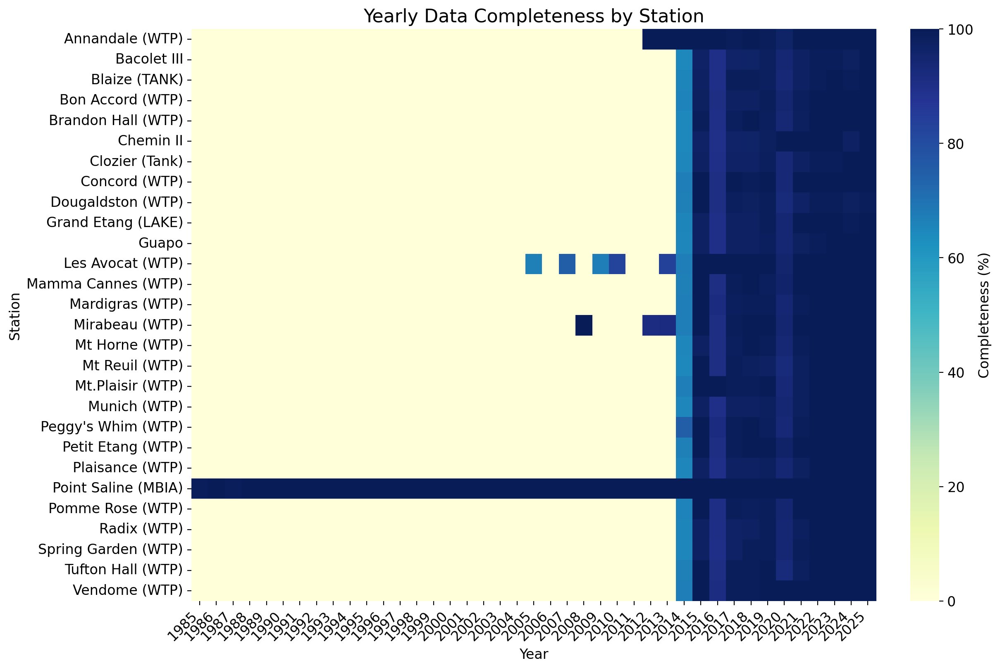

In [192]:
completeness_summary_est = calculate_yearly_completeness(rainfall_est_wide_E)
completeness_pivot_est = completeness_summary_est.pivot(index="station", columns="year", values="completeness_%")
plt.figure(figsize=(12, 8), dpi=200, constrained_layout=True)
ax = sns.heatmap(
    completeness_pivot_est,
    cmap="YlGnBu",
    vmin=0,
    vmax=100,
    annot=False,
    cbar_kws={"label": "Completeness (%)"}
)
ax.set_title("Yearly Data Completeness by Station", fontsize=16)
ax.set_xlabel("Year", fontsize=12)
ax.set_ylabel("Station", fontsize=12)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
colorbar = ax.collections[0].colorbar
colorbar.ax.tick_params(labelsize=12)
colorbar.set_label("Completeness (%)", fontsize=12)
plt.show()

## 6.6 POTS/BM Data preparation

### 6.6.1 Model E predictions

In [190]:
# year completeness < 60% set all year values to nan
rainfall_est_wide_E["year"] = rainfall_est_wide_E["date"].dt.year
comp_mask = completeness_pivot_est >= 60

for station in comp_mask.index:  # station IDs
    if station in rainfall_est_wide_E.columns:
        # For each year, mask out rainfall where completeness < 60
        bad_years = comp_mask.loc[station] == False
        years_to_nan = bad_years[bad_years].index.astype(int)

        rainfall_est_wide_E.loc[
            rainfall_est_wide_E["year"].isin(years_to_nan),
            station
        ] = np.nan

if export:
    rainfall_est_wide_E.to_csv(r'Outputs\GRN_RAINFALL_MODELE_FINAL_n6_thr25mm_var0p25_full.csv')

### 6.6.2 Model EElev predictions

In [191]:
# year completeness < 60% set all year values to nan
rainfall_est_wide_EElev["year"] = rainfall_est_wide_EElev["date"].dt.year
comp_mask = completeness_pivot_est >= 60

for station in comp_mask.index:  # station IDs
    if station in rainfall_est_wide_EElev.columns:
        # For each year, mask out rainfall where completeness < 60
        bad_years = comp_mask.loc[station] == False
        years_to_nan = bad_years[bad_years].index.astype(int)

        rainfall_est_wide_EElev.loc[
            rainfall_est_wide_EElev["year"].isin(years_to_nan),
            station
        ] = np.nan

if export:
    rainfall_est_wide_EElev.to_csv(r'Outputs\GRN_RAINFALL_MODELElev_FINAL_n6_thr25mm_var0p25_full.csv')

# 7.0 Other Interpolation methods

There are many other interpolation methods for rainfall imputation. These are namely as follows:

1) Nearest Neighbour Distance (NND)
2) Radial Basis function (RBF): (a) linear (RBF-L) and (b) thin-plate spline (RBF-TPS) (NB: RBF-L ~ IDW)
3) Guassian Process Regression (GPR)

There are ofcourse many more such as multiple linear regress (MLR) which also has shown reasonable success. However, performance across methods are quite similar and are only being evaluated here for completeness.

## 7.1 NND

In [50]:
pred_NND = fake_df.copy()

# Project coordinates
x, y = transformer.transform(pred_NND["Lon"].values, pred_NND["Lat"].values)
pred_NND["x"] = x
pred_NND["y"] = y

filled_rows = []
for date_id, df_day in pred_NND.groupby("date_id"):

    df_day = df_day.copy()
    df_day["rainfall_est"] = df_day["rainfall"]

    mask_missing = df_day["rainfall"].isna()
    mask_obs = ~mask_missing

    # If no missing values keep as-is
    if mask_missing.sum() == 0:
        filled_rows.append(df_day)
        continue

    # Coordinates
    XY = np.column_stack([df_day["x"].values, df_day["y"].values])

    XY_obs = XY[mask_obs]
    rain_obs = df_day.loc[mask_obs, "rainfall"].values

    XY_miss = XY[mask_missing]

    # Require at least 3 observations
    if mask_obs.sum() < 3:
        # Not enough data leave rainfall_Est as NaN
        filled_rows.append(df_day)
        continue

    # Nearest-neighbor interpolation
    nn = NearestNDInterpolator(XY_obs, rain_obs)
    df_day.loc[mask_missing, "rainfall_est"] = nn(XY_miss)

    filled_rows.append(df_day)

# Reassemble
pred_NND = (
    pd.concat(filled_rows, axis=0)
      .sort_index()
      .reset_index(drop=True)
)

## 7.2 RBF

### 7.2.1 RBF-L

In [51]:
pred_RBFL = fake_df.copy()

# Project coordinates
x, y = transformer.transform(pred_RBFL["Lon"].values, pred_RBFL["Lat"].values)
pred_RBFL["x"] = x
pred_RBFL["y"] = y

filled_rows = []

for date_id, df_day in pred_RBFL.groupby("date_id"):

    df_day = df_day.copy()

    # New column initialized with original rainfall
    df_day["rainfall_est"] = df_day["rainfall"]

    mask_missing = df_day["rainfall"].isna()
    mask_obs = ~mask_missing

    # If no missing values keep as-is
    if mask_missing.sum() == 0:
        filled_rows.append(df_day)
        continue

    # Coordinates
    XY = np.column_stack([df_day["x"].values, df_day["y"].values])

    XY_obs = XY[mask_obs]
    rain_obs = df_day.loc[mask_obs, "rainfall"].values

    XY_miss = XY[mask_missing]

    # Require at least 3 observations
    if mask_obs.sum() < 3:
        # Not enough data leave rainfall_est as NaN
        filled_rows.append(df_day)
        continue

    # RBF interpolation (linear kernel)
    try:
        rbf = RBFInterpolator(
            XY_obs,
            rain_obs,
            kernel="linear"
        )
        df_day.loc[mask_missing, "rainfall_est"] = rbf(XY_miss)

    except Exception:
        # If RBF fails leave missing as NaN
        filled_rows.append(df_day)
        continue

    filled_rows.append(df_day)

# Reassemble
pred_RBFL = (
    pd.concat(filled_rows, axis=0)
      .sort_index()
      .reset_index(drop=True)
)

### 7.2.2 RBF-TPS

In [52]:
pred_RBFTPS = fake_df.copy()

# Project coordinates
x, y = transformer.transform(pred_RBFTPS["Lon"].values, pred_RBFTPS["Lat"].values)
pred_RBFTPS["x"] = x
pred_RBFTPS["y"] = y

filled_rows = []

for date_id, df_day in pred_RBFTPS.groupby("date_id"):

    df_day = df_day.copy()

    # New column initialized with original rainfall
    df_day["rainfall_est"] = df_day["rainfall"]

    mask_missing = df_day["rainfall"].isna()
    mask_obs = ~mask_missing

    # If no missing values keep as-is
    if mask_missing.sum() == 0:
        filled_rows.append(df_day)
        continue

    # Coordinates
    XY = np.column_stack([df_day["x"].values, df_day["y"].values])

    XY_obs = XY[mask_obs]
    rain_obs = df_day.loc[mask_obs, "rainfall"].values

    XY_miss = XY[mask_missing]

    # Require at least 3 observations
    if mask_obs.sum() < 3:
        # Not enough data leave rainfall_est as NaN
        filled_rows.append(df_day)
        continue

    # RBF interpolation (thin_plate_spline kernel)
    try:
        rbf = RBFInterpolator(
            XY_obs,
            rain_obs,
            kernel="thin_plate_spline"
        )
        df_day.loc[mask_missing, "rainfall_est"] = rbf(XY_miss)

    except Exception:
        # If RBF fails leave missing as NaN
        filled_rows.append(df_day)
        continue

    filled_rows.append(df_day)

# Reassemble
pred_RBFTPS = (
    pd.concat(filled_rows, axis=0)
      .sort_index()
      .reset_index(drop=True)
)

## 7.3 GPR

### 7.3.1 Model training and testing

In [55]:
# Project coordinates
x, y = transformer.transform(rainfall_before_2005_filtered["Lon"].values, rainfall_before_2005_filtered["Lat"].values)
rainfall_before_2005_filtered["x_km"] = x/1000
rainfall_before_2005_filtered["y_km"] = y/1000

# run models
pred_space, metrics_space = daily_train_test_gpr(
    rainfall_before_2005_filtered, kernel_kind="space", test_frac=0.3, min_obs=6, seed=42
)

pred_space_elev, metrics_space_elev = daily_train_test_gpr(
    rainfall_before_2005_filtered, kernel_kind="space+elev", test_frac=0.3, min_obs=6, seed=42
)

metrics_space, metrics_space_elev

GPR per day (space):   0%|          | 0/785 [00:00<?, ?it/s]

C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 0.04. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 0.04. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 500.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGION\Desktop\Python_

GPR per day (space+elev):   0%|          | 0/785 [00:00<?, ?it/s]

C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__k2__length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 0.05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGI

({'N_test': 5821,
  'MAE': 4.39491348541593,
  'RMSE': 9.500798583956394,
  'Bias': -0.1968475280559878,
  'z_mean': -0.020801291411520807,
  'z_std': 1.0188003096061142,
  'y_mu': 6.462565652619756,
  'y_sigma': 13.610766764152885},
 {'N_test': 5821,
  'MAE': 4.726746370458284,
  'RMSE': 9.655542646665484,
  'Bias': -0.13465527085981516,
  'z_mean': -0.018382176982549344,
  'z_std': 1.0207786866014814,
  'y_mu': 6.462565652619756,
  'y_sigma': 13.610766764152885})

### 7.3.2 GPR Imputation

In [56]:
pred_GPRE = gpr_impute_by_day(
    fake_df,
    transformer=transformer,
    kernel_kind="space",
    min_obs=3,
    nu=1.5,
    n_restarts=5,
    seed=0,
    y_global_standardize=True,
    clip_nonneg=True,
)

pred_GPREElev = gpr_impute_by_day(
    fake_df,
    transformer=transformer,
    kernel_kind="space+elev",
    min_obs=3,
    nu=1.5,
    n_restarts=5,
    seed=0,
    y_global_standardize=True,
    clip_nonneg=True,
)

m_GPRE,   eval_GPRE   = evaluate_imputation(pred_GPRE,   mask_log, label_prefix="GPRE/")
m_GPREElev,   eval_GPREElev   = evaluate_imputation(pred_GPREElev,   mask_log, label_prefix="GPREElev/")

GPR impute by day (space):   0%|          | 0/785 [00:00<?, ?it/s]

C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 0.04. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 0.04. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 0.04. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGION\Desktop\Python_V2\ven

GPR impute by day (space+elev):   0%|          | 0/785 [00:00<?, ?it/s]

C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 0.05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGION\Desktop\Python_V2\venv_pymc\Lib\site-packages\sklearn\gaussian_process\kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 0.05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\LEGION\Desktop\P

## 7.4 Compare methods

In [57]:
m_E,   eval_E   = evaluate_imputation(pred_E,   mask_log, label_prefix="E/")
m_EE,  eval_EE  = evaluate_imputation(pred_EE,  mask_log, label_prefix="EElev/")
m_En,   eval_En   = evaluate_imputation(pred_En,   mask_log, label_prefix="En/")
m_EEn,  eval_EEn  = evaluate_imputation(pred_EEn,  mask_log, label_prefix="EElevn/")
m_NND,   eval_NND   = evaluate_imputation(pred_NND,   mask_log, label_prefix="NND/")
m_RBFL,   eval_RBFL   = evaluate_imputation(pred_RBFL,   mask_log, label_prefix="RBFL/")
m_RBFTPS,   eval_RBFTPS   = evaluate_imputation(pred_RBFTPS,   mask_log, label_prefix="RBFTPS/")
m_GPRE,   eval_GPRE   = evaluate_imputation(pred_GPRE,   mask_log, label_prefix="GPRE/")
m_GPREElev,   eval_GPREElev   = evaluate_imputation(pred_GPREElev,   mask_log, label_prefix="GPREElev/")

# Collect metrics
comparisonn = {**m_E, **m_EE, **m_En, **m_EEn, **m_NND, **m_RBFL, **m_RBFTPS, **m_GPRE, **m_GPREElev}
comparisonn

{'E/MAE': 4.3877610860570595,
 'E/RMSE': 9.497955638780944,
 'E/Bias': 0.04834767917309975,
 'E/N_masked': 7850,
 'E/Corr': 0.7275821737959364,
 'EElev/MAE': 4.338593848199499,
 'EElev/RMSE': 9.406832515644219,
 'EElev/Bias': 0.026438675015708204,
 'EElev/N_masked': 7850,
 'EElev/Corr': 0.7336837293449542,
 'EAElev/MAE': 4.339635785995139,
 'EAElev/RMSE': 9.40788211283594,
 'EAElev/Bias': 0.02487437858158208,
 'EAElev/N_masked': 7850,
 'EAElev/Corr': 0.7336066147747652,
 'En/MAE': 4.394666608816969,
 'En/RMSE': 9.497599095202784,
 'En/Bias': 0.06853371129148712,
 'En/N_masked': 7850,
 'En/Corr': 0.7276480653062504,
 'EElevn/MAE': 4.328901129801062,
 'EElevn/RMSE': 9.383182268434433,
 'EElevn/Bias': 0.036385045620575894,
 'EElevn/N_masked': 7850,
 'EElevn/Corr': 0.7355059918335242,
 'EAElevn/MAE': 4.33345174559548,
 'EAElevn/RMSE': 9.385660749978445,
 'EAElevn/Bias': 0.03322305594175461,
 'EAElevn/N_masked': 7850,
 'EAElevn/Corr': 0.735293438229389,
 'NND/MAE': 4.999012229299363,
 'NND/